In [1]:
import warnings
warnings.simplefilter(action='ignore')

In [2]:
import scanpy as sc
import scarches as sca
import matplotlib.pyplot as plt
import numpy as np

import sys
sys.path.insert(0, '../')
import scripts.annotation_transfer_utils as atu

In [17]:
sc.set_figure_params(dpi=150, frameon=False, figsize=(4, 4))

## load data and pretrained model

In [4]:
adata = sc.read('./covid_kang_pbmc_integrated_le.h5ad')

In [5]:
adata

AnnData object with n_obs × n_vars = 64812 × 1972
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue', 'batch2', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'stim', 'seurat_annotations', 'integrated_snn_res.0.5', 'seurat_clusters', 'condition', 'cell_type', 'batch_join', 'cell_type_joint', 'source', 'source2', 'celltype'
    var: 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable_nbatches-0', 'highly_variable_intersection-0', 'ENS-0-1'
    uns: 'batch_colors', 'cell_type_joint_colors', 'neighbors', 'source2_colors', 'study_colors', 'terms', 'umap'
    obsm: 'X_cvae', 'X_umap'
    obsp: 'connectivities', 'distances'

In [6]:
model = sca.models.TRVAE.load("./cvae_kang_covid_query/", adata)


INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 1972 256 6
	Hidden Layer 1 in/out: 256 256
	Hidden Layer 2 in/out: 256 256
	Mean/Var Layer in/out: 256 282
Encoder Architecture:
	Input Layer in, out and cond: 1972 128 6
	Mean/Var Layer in/out: 128 1
Decoder Architecture:
	Masked linear layer in, out and cond:  282 1972 6


# overall visualization

IFN+ctrl

In [312]:
d1 = adata[adata.obs.source.isin(["control", "INF-Beta"])]

In [336]:
sc.tl.rank_genes_groups(d1, groupby="celltype")

Trying to set attribute `.uns` of view, copying.


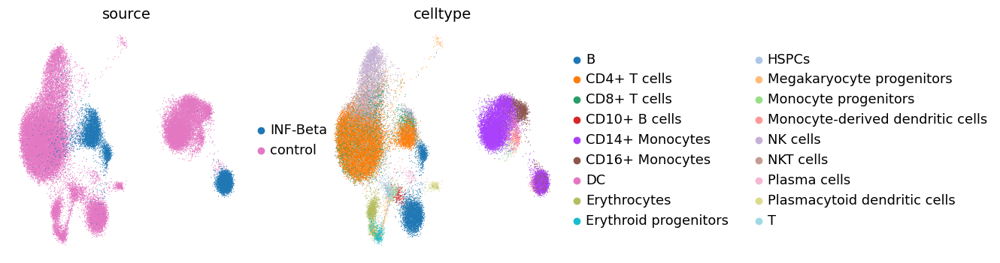

In [461]:
sc.pl.umap(d1, color=["source", "celltype"])

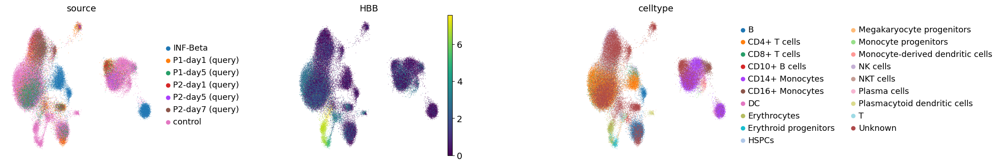

In [462]:
sc.pl.umap(adata, color=["source", "HBB", "celltype"], wspace=0.7)

### normalizing  the raw data 

In [47]:
adata_raw = adata.raw.to_adata()

In [51]:
adata_raw.X = np.nan_to_num(adata_raw.X)

In [53]:
sc.pp.normalize_per_cell(adata_raw)
sc.pp.log1p(adata_raw)

In [54]:
adata.raw = adata_raw 

In [57]:
ref = adata[adata.obs.source.isin(["INF-Beta", "control"])]
query = adata[~adata.obs.source.isin(["INF-Beta", "control"])]

In [384]:
sc.pp.neighbors(query, use_rep="X_cvae", n_neighbors=10)

In [385]:
sc.tl.umap(query)

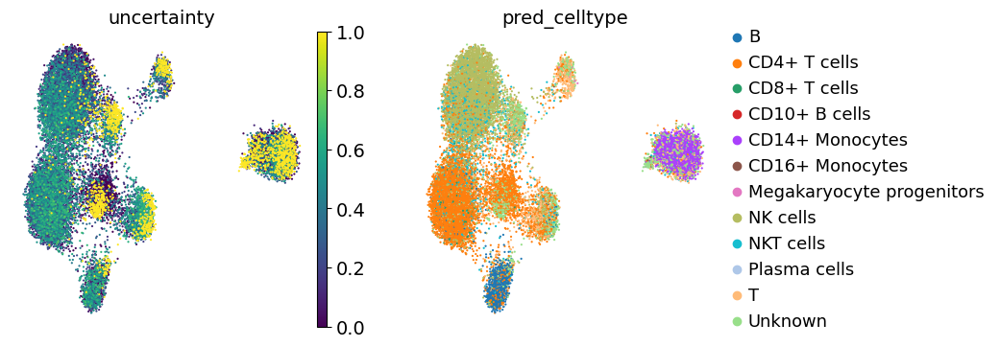

In [389]:
sc.pl.umap(query,  color=['uncertainty', "pred_celltype"], frameon=False,  size=10)

In [393]:
sc.tl.leiden(query, resolution=1.1)

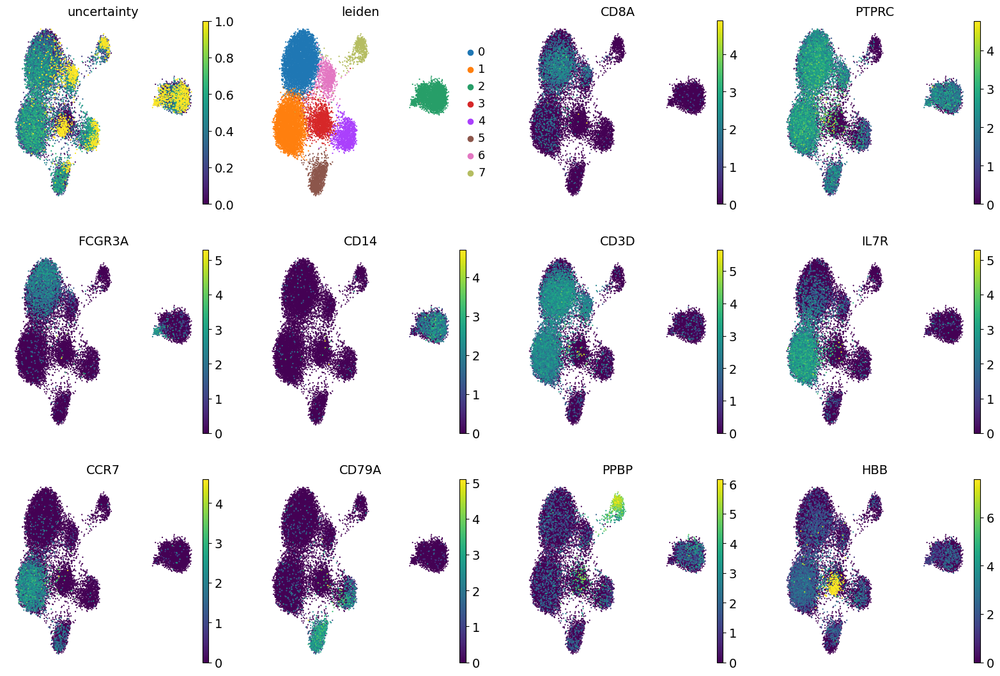

In [405]:
sc.pl.umap(query,  color=['uncertainty',"leiden",
                          "CD8A","PTPRC",
                          "FCGR3A",
                         "CD14","CD3D", "IL7R", "CCR7"
                          , "CD79A", "PPBP", "HBB"], frameon=False,  size=10)

In [472]:
query.obs.celltype = "NA"
query.obs.celltype[query.obs.leiden == "0"] = "CD8T-NK"
query.obs.celltype[query.obs.leiden == "1"] = "CD4+ T cells"
query.obs.celltype[query.obs.leiden == "2"] = "Monocytes"
query.obs.celltype[query.obs.leiden == "3"] = "Erythrocytes"
query.obs.celltype[query.obs.leiden == "4"] = "Plasma B"
query.obs.celltype[query.obs.leiden == "5"] = "B"
query.obs.celltype[query.obs.leiden == "6"] = "CD8+ T cells"
query.obs.celltype[query.obs.leiden == "7"] = "Platelets"



In [469]:
sc.tl.leiden(query, resolution=0.6, restrict_to=("leiden", ["2"]))

... storing 'celltype' as categorical


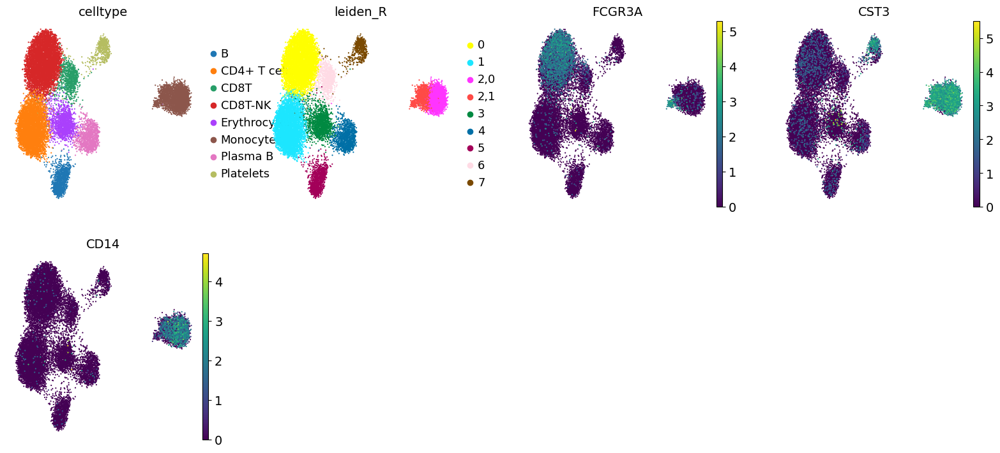

In [470]:
sc.pl.umap(query,  color=['celltype',"leiden_R","FCGR3A","CST3", "CD14"], frameon=False,  size=10)

In [473]:
query.obs.celltype[(query.obs.leiden == "2") & (query.raw[:, "FCGR3A"].X >= 1.5).flatten()] = "CD16+ Monocytes"
query.obs.celltype[(query.obs.leiden == "2") & (query.raw[:, "FCGR3A"].X < 1.5).flatten()] = "CD14+ Monocytes"


... storing 'celltype' as categorical


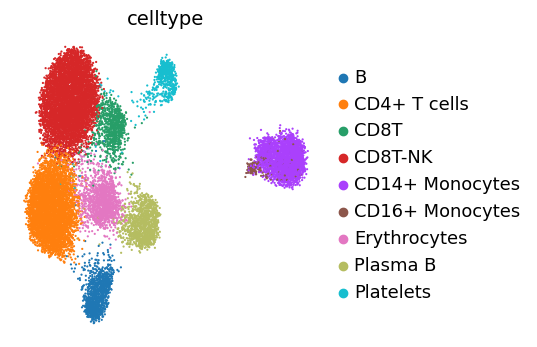

In [474]:
sc.pl.umap(query,  color=['celltype'], frameon=False,  size=10)

In [477]:
sc.tl.leiden(query, resolution=0.6, restrict_to=("leiden", ["0"]))

In [ ]:
sc.pl.umap(query,  color=["leiden_R","CD3D","CD8A",
                          "FCGR3A", "CCR7","IL7R",'celltype',"CD40LG"], frameon=False,  size=10)

In [493]:
query.obs.celltype = list(query.obs.celltype)

In [494]:
query.obs.celltype[(query.obs.leiden_R == "0,0")] = "CD8+ T cells"
query.obs.celltype[(query.obs.leiden_R == "0,1")] = "NK cells"


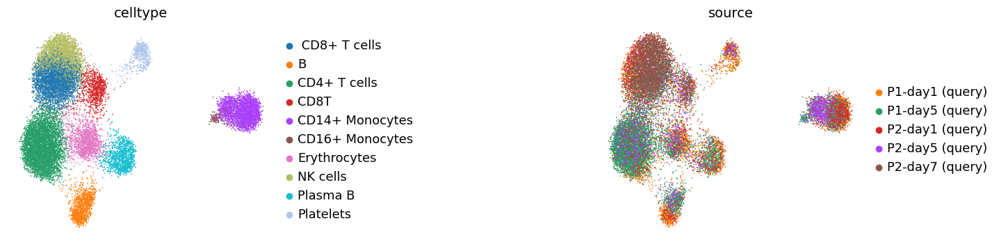

In [488]:
sc.pl.umap(query, color=["celltype", "source"], wspace=1)

merging ref and query 

In [497]:
adata_new = ref.concatenate(query, batch_key="batch_union")

In [498]:
adata.obs.celltype.cat.categories

Index(['B', 'CD4+ T cells', 'CD8+ T cells', 'CD10+ B cells', 'CD14+ Monocytes',
       'CD16+ Monocytes', 'DC', 'Erythrocytes', 'Erythroid progenitors',
       'HSPCs', 'Megakaryocyte progenitors', 'Monocyte progenitors',
       'Monocyte-derived dendritic cells', 'NK cells', 'NKT cells',
       'Plasma cells', 'Plasmacytoid dendritic cells', 'T', 'Unknown'],
      dtype='object')

In [509]:
sc.pp.neighbors(adata_new, use_rep="X_cvae")

In [511]:
sc.tl.umap(adata_new)

In [ ]:
sc.pl.umap(adata_new, color=["celltype", "source"], wspace=1.3)

In [516]:
# adata_new.write("ref_query_anotated.h5ad")

# Start for Carlos

In [4]:
adata = sc.read("ref_query_anotated.h5ad")

In [5]:
model = sca.models.TRVAE.load("./cvae_kang_covid_query/", adata)


INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 1972 256 6
	Hidden Layer 1 in/out: 256 256
	Hidden Layer 2 in/out: 256 256
	Mean/Var Layer in/out: 256 282
Encoder Architecture:
	Input Layer in, out and cond: 1972 128 6
	Mean/Var Layer in/out: 128 1
Decoder Architecture:
	Masked linear layer in, out and cond:  282 1972 6


## Diffetential enrichment analysis with expmap

In [9]:
sc.set_figure_params(dpi=150, frameon=False, figsize=(4, 4))

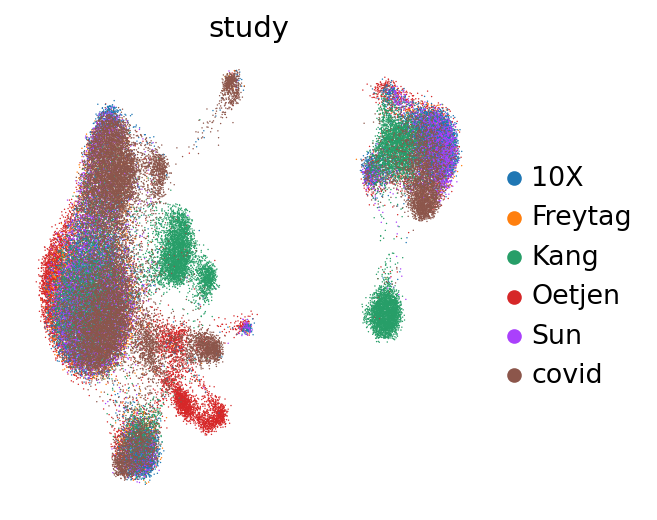

In [10]:
sc.pl.umap(adata, color=["study"], wspace=0.9)

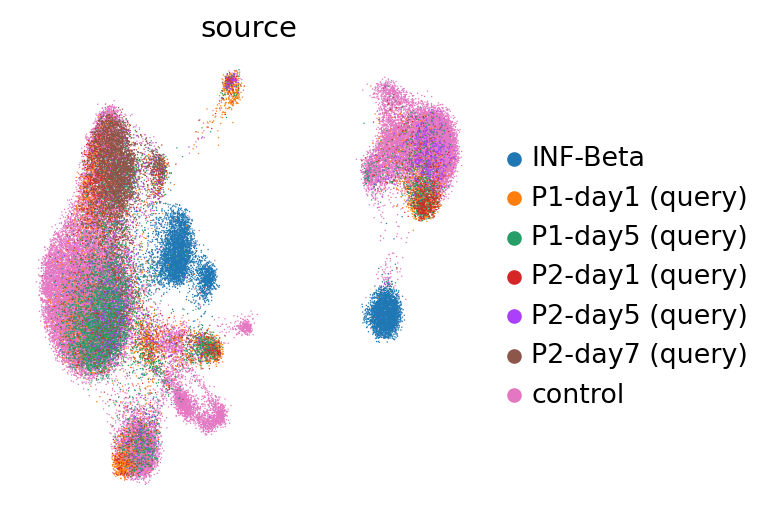

In [11]:
sc.pl.umap(adata, color=["source"], wspace=0.9)

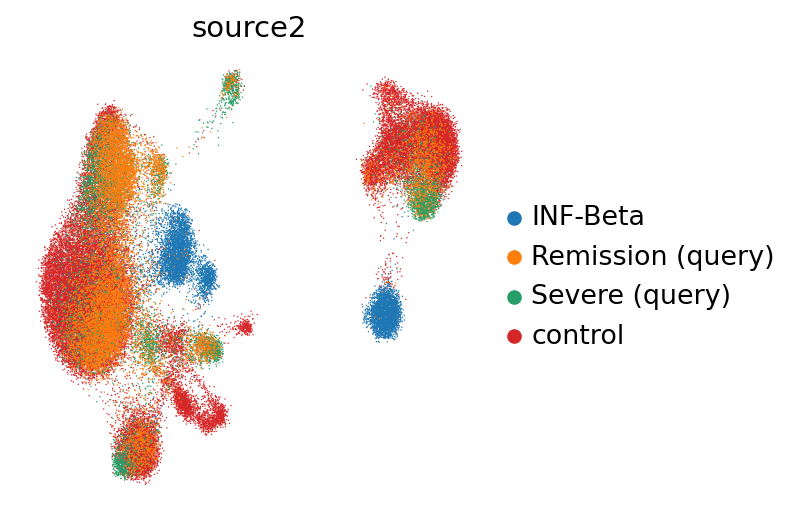

In [12]:
sc.pl.umap(adata, color=["source2"], wspace=0.9)

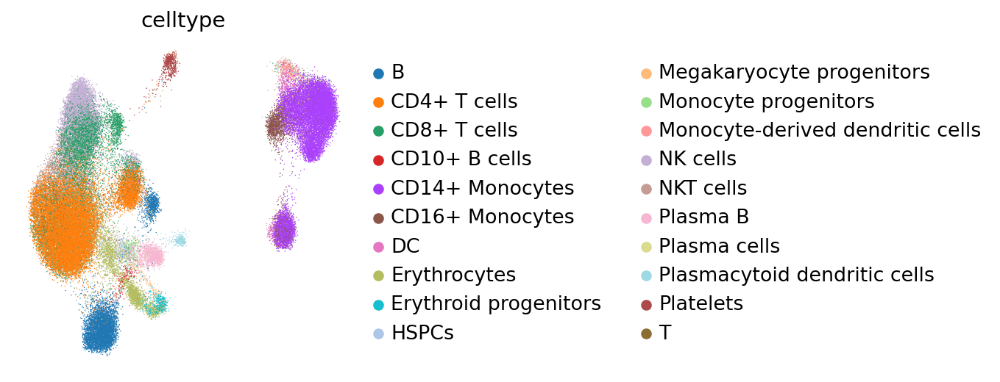

In [13]:
sc.pl.umap(adata, color=["celltype"], wspace=0.9)

In [35]:
#check cell types in the query data 

In [6]:
ct = ['B', 'CD4+ T cells', 'CD8+ T cells', 'CD14+ Monocytes',
       'CD16+ Monocytes', 'Erythrocytes','NK cells',
       'Plasma B', "Platelets"]

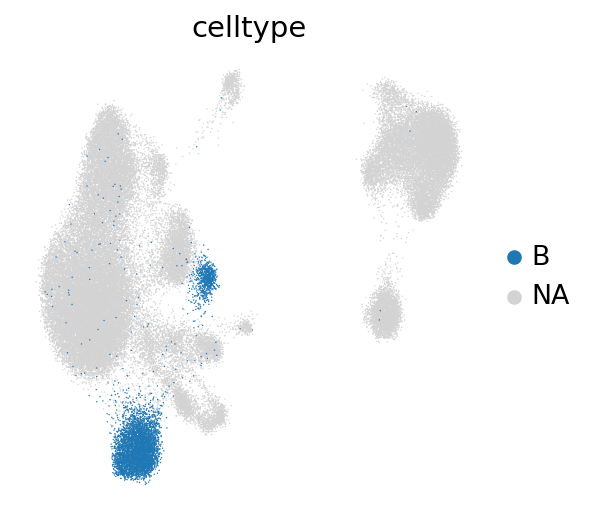

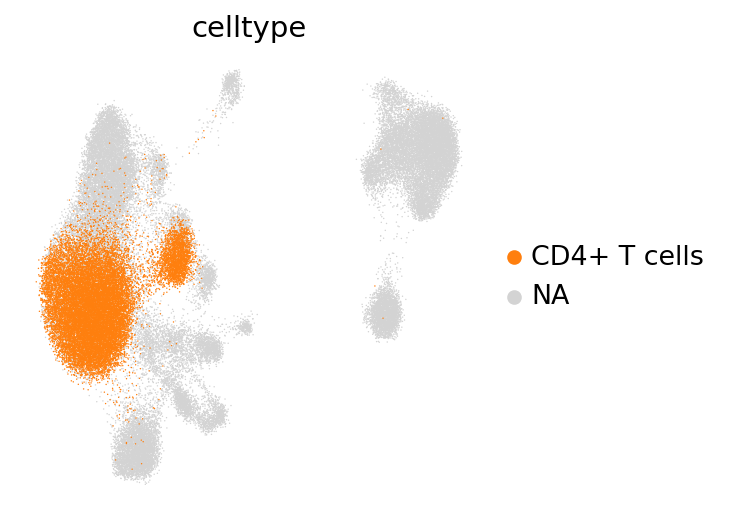

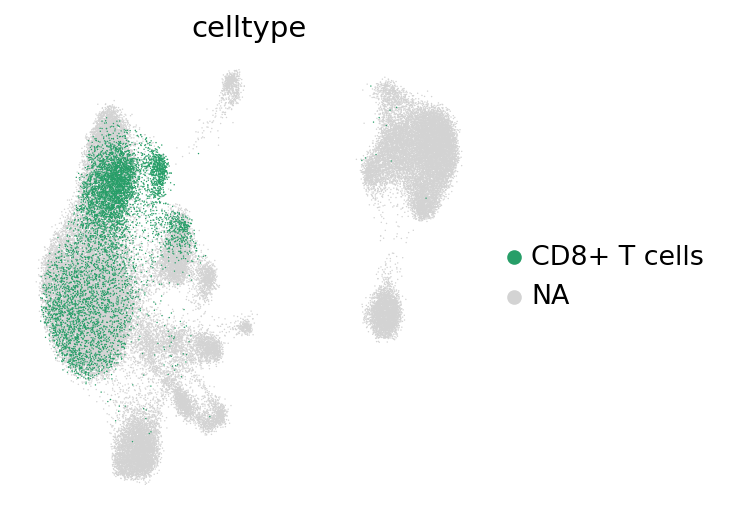

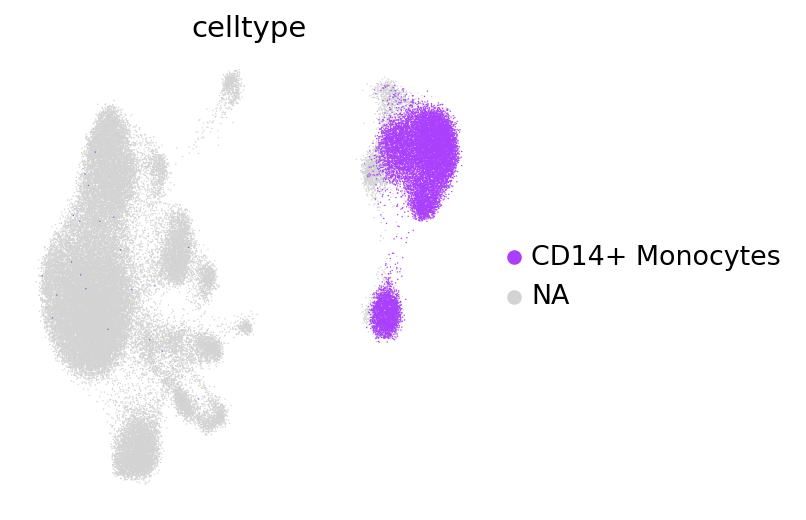

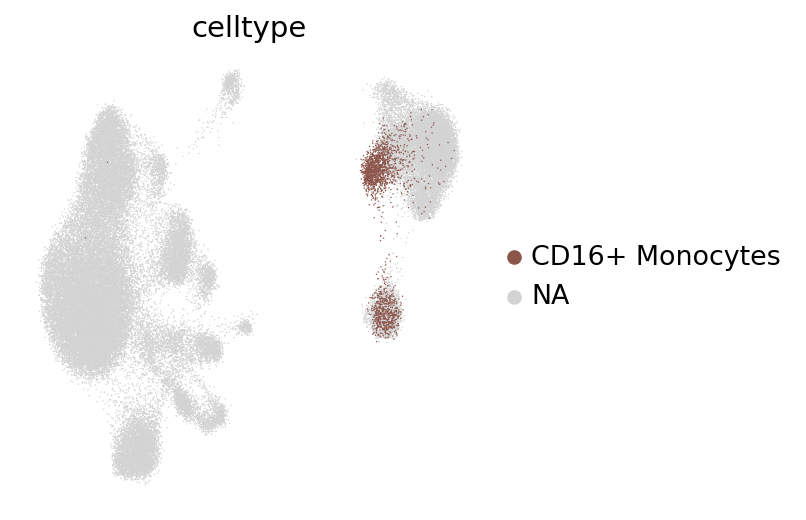

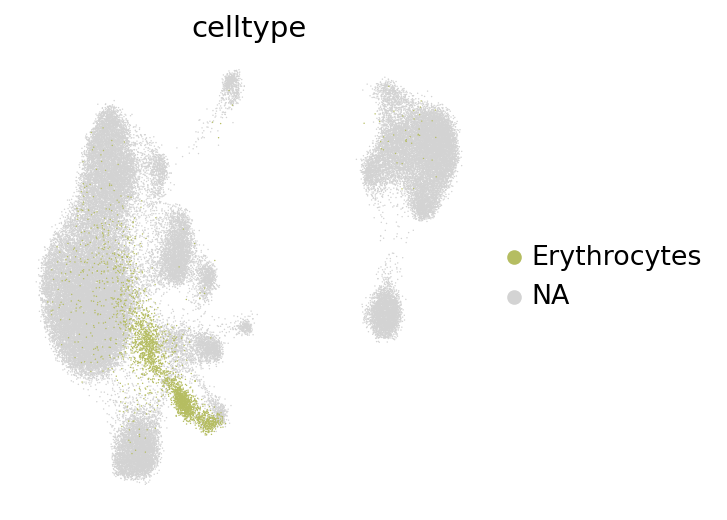

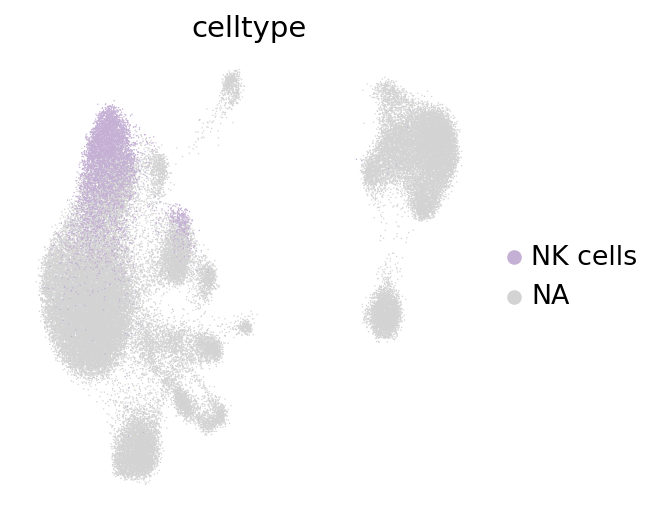

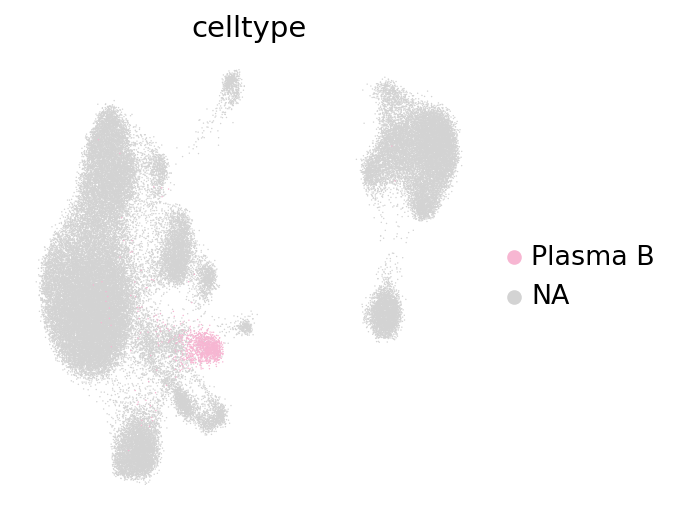

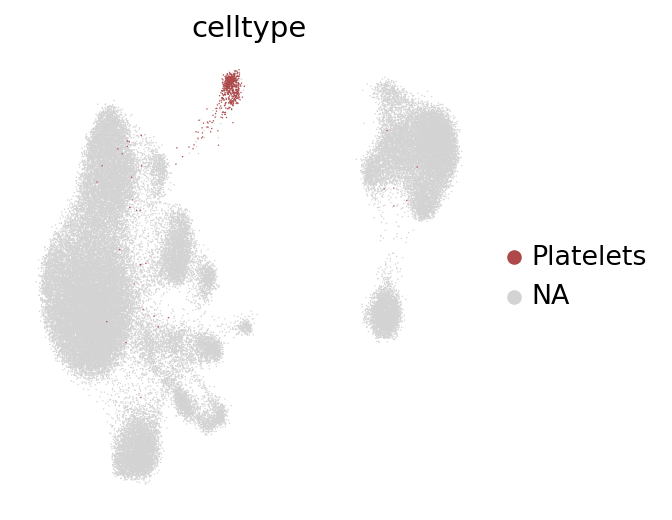

In [28]:
for i in ct :
    sc.pl.umap(adata, color=["celltype"], groups=[i])

pathway analysis 

In [7]:
inactive_idx = ~(model.model.decoder.L0.expr_L.weight.data.norm(p=2, dim=0)>0).cpu().numpy()
[term for i, term in enumerate(adata.uns['terms']) if inactive_idx[i]]

['PYRUVATE_METABOLISM_AND_CITRIC',
 'DAG_AND_IP3_SIGNALING',
 'GROWTH_HORMONE_RECEPTOR_SIGNAL',
 'NEF_MEDIATES_DOWN_MODULATION_O',
 'O_LINKED_GLYCOSYLATION_OF_MUCI',
 'SPHINGOLIPID_DE_NOVO_BIOSYNTHE',
 'NUCLEAR_SIGNALING_BY_ERBB4',
 'ACTIVATED_NOTCH1_TRANSMITS_SIG',
 'RORA_ACTIVATES_CIRCADIAN_EXPRE',
 'YAP1_AND_WWTR1_TAZ_STIMULATED_',
 'EXTRACELLULAR_MATRIX_ORGANIZAT',
 'CIRCADIAN_REPRESSION_OF_EXPRES',
 'SIGNALLING_TO_RAS',
 'HEPARAN_SULFATE_HEPARIN_HS_GAG',
 'SIGNALING_BY_FGFR_MUTANTS',
 'BASIGIN_INTERACTIONS',
 'ERK_MAPK_TARGETS',
 'TRANSPORT_OF_MATURE_TRANSCRIPT',
 'NRAGE_SIGNALS_DEATH_THROUGH_JN',
 'REGULATION_OF_APOPTOSIS',
 'PHASE1_FUNCTIONALIZATION_OF_CO',
 'CA_DEPENDENT_EVENTS',
 'G1_PHASE',
 'P53_DEPENDENT_G1_DNA_DAMAGE_RE',
 'RNA_POL_II_TRANSCRIPTION_PRE_I',
 'NUCLEOTIDE_EXCISION_REPAIR',
 'CLASS_B_2_SECRETIN_FAMILY_RECE',
 'FORMATION_OF_RNA_POL_II_ELONGA',
 'G_BETA_GAMMA_SIGNALLING_THROUG',
 'CELL_JUNCTION_ORGANIZATION',
 'PI_3K_CASCADE',
 'TAK1_ACTIVATES_NFKB_BY_PHOSPHO',


In [8]:
adata.uns['active_terms'] = np.array(adata.uns['terms'])[model.model.decoder.nonzero_terms()]

In [9]:
directions = model._latent_directions(method="sum")
adata.obsm['X_cvae'] *= directions[model.model.decoder.nonzero_terms()]

In [10]:
adata.obs.source.value_counts()

control            38843
INF-Beta            7217
P1-day5 (query)     6980
P1-day1 (query)     4672
P2-day7 (query)     3332
P2-day1 (query)     2280
P2-day5 (query)     1488
Name: source, dtype: int64

In [11]:
scores_cond = model.latent_enrich('celltype',adata=adata, directions=directions,n_perm=5000)

In [12]:
def filter_set_scores(scores, adata, filter_v=2.31):
    dic_k = {}
    for k in scores:
        print(k)
        mask = np.abs(scores[k]['bf']) > filter_v
        s = sum(mask)
        dic_k[k] = {}
        if s > 0:
            sort = np.argsort(np.abs(scores[k]['bf'])[mask])[::-1]
            enriched_terms = adata.uns['terms'][mask][sort]
            
            print(enriched_terms)
            print(scores[k]['bf'][mask][sort])
            dic_k[k]["terms"] = enriched_terms
            dic_k[k]["bf"] = scores[k]['bf'][mask][sort]   
            for term in enriched_terms:
                adata.obs[term] = adata.obsm['X_cvae'][:, adata.uns['active_terms'] == term]
            
    return dic_k

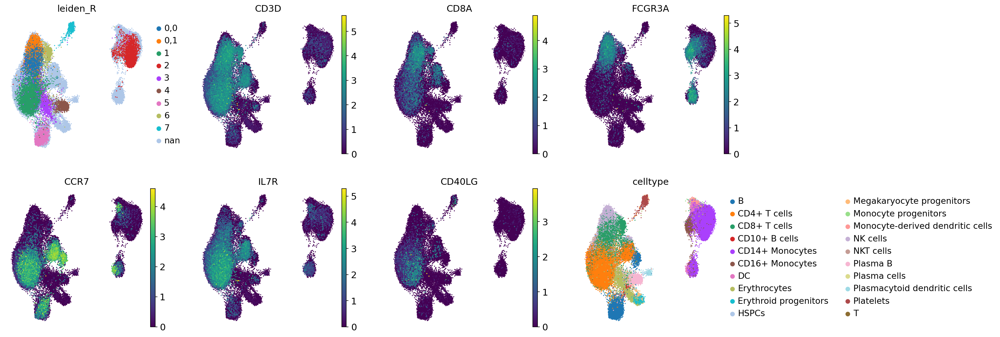

In [24]:
sc.pl.umap(adata,  color=["leiden_R","CD3D","CD8A",
                          "FCGR3A", "CCR7","IL7R","CD40LG",'celltype'], frameon=False,  size=10)

In [13]:
ct_pathway = {}
ct_pathway_adata = {}
for i in ct :
    print(i)
    ct_pathway_adata[i] =  adata[adata.obs.celltype == i]
    if np.sum(ct_pathway_adata[i].obs.source == "control")>10:
        scores_cond = model.latent_enrich('source2',comparison="control", adata=ct_pathway_adata[i],n_perm=10000)
        ct_pathway[i] = filter_set_scores(scores_cond, ct_pathway_adata[i], filter_v=0.5)
    else:
        print(f"no control cells in {i}")
        ct_pathway[i] = "no_control"

B


Trying to set attribute `.obs` of view, copying.


INF-Beta
['INTERFERON_SIGNALING' 'INTERFERON_ALPHA_BETA_SIGNALIN' 'IMMUNE_SYSTEM'
 'SIGNALING_BY_THE_B_CELL_RECEPT' 'ADAPTIVE_IMMUNE_SYSTEM'
 'NUCLEOTIDE_BINDING_DOMAIN_LEUC' 'DEVELOPMENTAL_BIOLOGY'
 'METABOLISM_OF_RNA' 'GENERIC_TRANSCRIPTION_PATHWAY'
 'METABOLISM_OF_AMINO_ACIDS_AND_' 'DIABETES_PATHWAYS'
 'INNATE_IMMUNE_SYSTEM' 'APOPTOSIS' 'GLYCOSAMINOGLYCAN_METABOLISM'
 'PEPTIDE_LIGAND_BINDING_RECEPTO' 'PLATELET_ACTIVATION_SIGNALING_'
 'FATTY_ACID_TRIACYLGLYCEROL_AND' 'SRP_DEPENDENT_COTRANSLATIONAL_'
 'CLASS_I_MHC_MEDIATED_ANTIGEN_P' 'METABOLISM_OF_NUCLEOTIDES'
 'TCR_SIGNALING']
[ 5.05  4.95  2.32 -1.27  1.2  -1.12  0.8  -0.79  0.78  0.76  0.73  0.67
 -0.59  0.58  0.58  0.56 -0.56 -0.55 -0.55 -0.55 -0.51]
Severe (query)
['RIG_I_MDA5_MEDIATED_INDUCTION_' 'SIGNALING_BY_TGF_BETA_RECEPTOR'
 'PEPTIDE_LIGAND_BINDING_RECEPTO' 'TRIF_MEDIATED_TLR3_SIGNALING'
 'METABOLISM_OF_MRNA' 'METABOLISM_OF_RNA' 'NUCLEOTIDE_BINDING_DOMAIN_LEUC'
 'FACTORS_INVOLVED_IN_MEGAKARYOC' 'METABOLISM_OF_AMINO_ACIDS_A

Trying to set attribute `.obs` of view, copying.


INF-Beta
['INTERFERON_SIGNALING' 'INTERFERON_ALPHA_BETA_SIGNALIN'
 'ADAPTIVE_IMMUNE_SYSTEM' 'METABOLISM_OF_PROTEINS' 'IMMUNE_SYSTEM'
 'SIGNALING_BY_TGF_BETA_RECEPTOR' 'TRANSMEMBRANE_TRANSPORT_OF_SMA'
 'SRP_DEPENDENT_COTRANSLATIONAL_' 'TCR_SIGNALING'
 'METABOLISM_OF_CARBOHYDRATES' 'METABOLISM_OF_MRNA'
 'RIG_I_MDA5_MEDIATED_INDUCTION_' 'MUSCLE_CONTRACTION']
[ 5.44  4.28  1.59 -0.98  0.94 -0.9  -0.69 -0.68 -0.63 -0.61  0.59 -0.56
 -0.51]
Severe (query)
['NUCLEOTIDE_BINDING_DOMAIN_LEUC' 'PLATELET_ACTIVATION_SIGNALING_'
 'METABOLISM_OF_MRNA' 'HEMOSTASIS' 'SIGNALING_BY_ILS' 'SIGNALING_BY_NOTCH'
 'METABOLISM_OF_RNA' 'RIG_I_MDA5_MEDIATED_INDUCTION_'
 'SIGNALING_BY_THE_B_CELL_RECEPT']
[ 1.45 -1.    0.8   0.72 -0.68 -0.67  0.66  0.62  0.55]
Remission (query)
['SIGNALING_BY_TGF_BETA_RECEPTOR' 'METABOLISM_OF_MRNA' 'METABOLISM_OF_RNA'
 'TRANSMEMBRANE_TRANSPORT_OF_SMA' 'RIG_I_MDA5_MEDIATED_INDUCTION_'
 'PEPTIDE_LIGAND_BINDING_RECEPTO' 'IMMUNE_SYSTEM'
 'PLATELET_ACTIVATION_SIGNALING_' 'MHC_CLASS_II_A

Trying to set attribute `.obs` of view, copying.


INF-Beta
['INTERFERON_SIGNALING' 'INTERFERON_ALPHA_BETA_SIGNALIN'
 'ADAPTIVE_IMMUNE_SYSTEM' 'CLASS_A1_RHODOPSIN_LIKE_RECEPT'
 'METABOLISM_OF_MRNA' 'GPCR_LIGAND_BINDING' 'METABOLISM_OF_RNA'
 'SIGNALING_BY_TGF_BETA_RECEPTOR' 'NUCLEOTIDE_BINDING_DOMAIN_LEUC'
 'CLASS_I_MHC_MEDIATED_ANTIGEN_P' 'CYTOKINE_SIGNALING_IN_IMMUNE_S'
 'SIGNALING_BY_GPCR' 'METABOLISM_OF_AMINO_ACIDS_AND_'
 'GENERIC_TRANSCRIPTION_PATHWAY' 'METABOLISM_OF_PROTEINS'
 'SLC_MEDIATED_TRANSMEMBRANE_TRA' 'DIABETES_PATHWAYS'
 'TRANSMEMBRANE_TRANSPORT_OF_SMA' 'GPCR_DOWNSTREAM_SIGNALING'
 'MUSCLE_CONTRACTION' 'CELL_SURFACE_INTERACTIONS_AT_T'
 'METABOLISM_OF_CARBOHYDRATES' 'IMMUNE_SYSTEM' 'TCR_SIGNALING'
 'GLYCOSAMINOGLYCAN_METABOLISM']
[ 4.31  4.11  2.72  1.91 -1.69 -1.52 -1.25 -1.25 -1.03 -1.02  1.    0.92
  0.9   0.81 -0.73 -0.7   0.68 -0.66 -0.63 -0.61  0.56 -0.54  0.51 -0.51
  0.5 ]
Severe (query)
['METABOLISM_OF_MRNA' 'METABOLISM_OF_RNA' 'CLASS_A1_RHODOPSIN_LIKE_RECEPT'
 'SIGNALING_BY_GPCR' 'IMMUNOREGULATORY_INTERACTIONS_'


Trying to set attribute `.obs` of view, copying.


INF-Beta
['INTERFERON_SIGNALING' 'INTERFERON_ALPHA_BETA_SIGNALIN'
 'GPCR_DOWNSTREAM_SIGNALING' 'METABOLISM_OF_CARBOHYDRATES'
 'SIGNALING_BY_GPCR' 'IMMUNE_SYSTEM' 'ADAPTIVE_IMMUNE_SYSTEM'
 'CYTOKINE_SIGNALING_IN_IMMUNE_S' 'METABOLISM_OF_NUCLEOTIDES'
 'METABOLISM_OF_AMINO_ACIDS_AND_' 'METABOLISM_OF_RNA'
 'SRP_DEPENDENT_COTRANSLATIONAL_' 'APOPTOSIS' 'METABOLISM_OF_MRNA'
 'BIOLOGICAL_OXIDATIONS' 'PLATELET_ACTIVATION_SIGNALING_'
 'GENERIC_TRANSCRIPTION_PATHWAY' 'FACTORS_INVOLVED_IN_MEGAKARYOC'
 'METABOLISM_OF_LIPIDS_AND_LIPOP' 'MUSCLE_CONTRACTION'
 'MHC_CLASS_II_ANTIGEN_PRESENTAT' 'SLC_MEDIATED_TRANSMEMBRANE_TRA'
 'AMYLOIDS' 'CLASS_I_MHC_MEDIATED_ANTIGEN_P' 'SIGNALING_BY_NOTCH'
 'TRANSMEMBRANE_TRANSPORT_OF_SMA' 'AXON_GUIDANCE' 'TCR_SIGNALING'
 'SIGNALING_BY_THE_B_CELL_RECEPT' 'DEVELOPMENTAL_BIOLOGY' 'TRANSCRIPTION'
 'INNATE_IMMUNE_SYSTEM' 'FATTY_ACID_TRIACYLGLYCEROL_AND'
 'SIGNALING_BY_RHO_GTPASES' 'METABOLISM_OF_PROTEINS'
 'CELL_SURFACE_INTERACTIONS_AT_T' 'HEMOSTASIS'
 'PEPTIDE_LIGAND_BIND

Trying to set attribute `.obs` of view, copying.


INF-Beta
['INTERFERON_SIGNALING' 'INTERFERON_ALPHA_BETA_SIGNALIN'
 'ADAPTIVE_IMMUNE_SYSTEM' 'IMMUNE_SYSTEM' 'APOPTOSIS' 'AXON_GUIDANCE'
 'GPCR_DOWNSTREAM_SIGNALING' 'METABOLISM_OF_NUCLEOTIDES'
 'METABOLISM_OF_PROTEINS' 'IMMUNOREGULATORY_INTERACTIONS_'
 'FACTORS_INVOLVED_IN_MEGAKARYOC' 'SIGNALING_BY_GPCR'
 'METABOLISM_OF_CARBOHYDRATES' 'METABOLISM_OF_AMINO_ACIDS_AND_'
 'CYTOKINE_SIGNALING_IN_IMMUNE_S' 'GPCR_LIGAND_BINDING'
 'SIGNALING_BY_THE_B_CELL_RECEPT' 'TCR_SIGNALING' 'SIGNALING_BY_NOTCH'
 'AMYLOIDS' 'MUSCLE_CONTRACTION' 'CLASS_I_MHC_MEDIATED_ANTIGEN_P'
 'FATTY_ACID_TRIACYLGLYCEROL_AND' 'PHOSPHOLIPID_METABOLISM' 'HEMOSTASIS'
 'INNATE_IMMUNE_SYSTEM' 'GENERIC_TRANSCRIPTION_PATHWAY'
 'NUCLEOTIDE_BINDING_DOMAIN_LEUC' 'TRANSMEMBRANE_TRANSPORT_OF_SMA'
 'SIGNALING_BY_RHO_GTPASES' 'CLASS_A1_RHODOPSIN_LIKE_RECEPT']
[ 6.21  6.12  2.22  2.03 -2.01  1.88 -1.84 -1.58 -1.53 -1.32 -1.28  1.26
 -1.08  1.07  0.99 -0.99 -0.95 -0.9  -0.89  0.72 -0.69 -0.66 -0.64  0.62
 -0.61  0.6   0.58 -0.57 -0.56  0

Trying to set attribute `.obs` of view, copying.


Severe (query)
['HEMOSTASIS' 'TRIF_MEDIATED_TLR3_SIGNALING'
 'SLC_MEDIATED_TRANSMEMBRANE_TRA' 'CELL_SURFACE_INTERACTIONS_AT_T'
 'FACTORS_INVOLVED_IN_MEGAKARYOC' 'METABOLISM_OF_MRNA' 'APOPTOSIS'
 'TOLL_RECEPTOR_CASCADES' 'SIGNALING_BY_TGF_BETA_RECEPTOR'
 'MUSCLE_CONTRACTION' 'CELL_CYCLE_MITOTIC' 'DEVELOPMENTAL_BIOLOGY'
 'CLASS_I_MHC_MEDIATED_ANTIGEN_P' 'GENERIC_TRANSCRIPTION_PATHWAY'
 'METABOLISM_OF_NUCLEOTIDES' 'METABOLISM_OF_PROTEINS' 'DIABETES_PATHWAYS'
 'PLATELET_ACTIVATION_SIGNALING_' 'AXON_GUIDANCE'
 'CYTOKINE_SIGNALING_IN_IMMUNE_S' 'CELL_CYCLE' 'TRANSCRIPTION'
 'TRANSMEMBRANE_TRANSPORT_OF_SMA' 'AMYLOIDS'
 'FATTY_ACID_TRIACYLGLYCEROL_AND' 'SIGNALING_BY_RHO_GTPASES'
 'IMMUNE_SYSTEM' 'MEMBRANE_TRAFFICKING' 'CLASS_A1_RHODOPSIN_LIKE_RECEPT'
 'IMMUNOREGULATORY_INTERACTIONS_' 'GPCR_DOWNSTREAM_SIGNALING'
 'GLYCOSAMINOGLYCAN_METABOLISM']
[ 3.46  2.57  2.49  2.19 -1.93 -1.93  1.81  1.6   1.58  1.51 -1.29 -1.28
 -1.26 -1.2  -1.18 -1.18  1.15 -1.1  -1.02 -0.92  0.89 -0.78 -0.78  0.77
  0.76 

Trying to set attribute `.obs` of view, copying.


INF-Beta
['INTERFERON_SIGNALING' 'INTERFERON_ALPHA_BETA_SIGNALIN'
 'ADAPTIVE_IMMUNE_SYSTEM' 'IMMUNOREGULATORY_INTERACTIONS_'
 'GPCR_DOWNSTREAM_SIGNALING' 'IMMUNE_SYSTEM'
 'FATTY_ACID_TRIACYLGLYCEROL_AND' 'SIGNALING_BY_GPCR'
 'GPCR_LIGAND_BINDING' 'TOLL_RECEPTOR_CASCADES' 'METABOLISM_OF_PROTEINS'
 'MHC_CLASS_II_ANTIGEN_PRESENTAT' 'METABOLISM_OF_AMINO_ACIDS_AND_'
 'HEMOSTASIS' 'INNATE_IMMUNE_SYSTEM' 'BIOLOGICAL_OXIDATIONS'
 'MUSCLE_CONTRACTION' 'MEIOSIS' 'SIGNALING_BY_ILS']
[ 4.54  4.22  2.23 -1.64  1.22  1.13 -0.93 -0.88 -0.87  0.82 -0.79  0.68
  0.65 -0.64  0.63  0.62  0.59 -0.53 -0.51]
Severe (query)
['METABOLISM_OF_PROTEINS' 'RESPONSE_TO_ELEVATED_PLATELET_'
 'INTERFERON_SIGNALING' 'MHC_CLASS_II_ANTIGEN_PRESENTAT'
 'ADAPTIVE_IMMUNE_SYSTEM']
[1.05 0.8  0.77 0.61 0.57]
Remission (query)
['METABOLISM_OF_PROTEINS' 'INTERFERON_SIGNALING'
 'MHC_CLASS_II_ANTIGEN_PRESENTAT' 'PLATELET_ACTIVATION_SIGNALING_'
 'RESPONSE_TO_ELEVATED_PLATELET_' 'AXON_GUIDANCE' 'IMMUNE_SYSTEM'
 'RIG_I_MDA5_MEDIATED

##  Pathway analysis for specific cell types 

In [14]:
ct_pathway["CD8+ T cells"]['Remission (query)']

{'terms': array(['METABOLISM_OF_MRNA', 'METABOLISM_OF_RNA',
        'PLATELET_ACTIVATION_SIGNALING_', 'CLASS_A1_RHODOPSIN_LIKE_RECEPT',
        'SIGNALING_BY_TGF_BETA_RECEPTOR', 'SIGNALING_BY_GPCR',
        'IMMUNOREGULATORY_INTERACTIONS_', 'TRANSMEMBRANE_TRANSPORT_OF_SMA',
        'METABOLISM_OF_PROTEINS', 'GENERIC_TRANSCRIPTION_PATHWAY',
        'ADAPTIVE_IMMUNE_SYSTEM', 'MHC_CLASS_II_ANTIGEN_PRESENTAT',
        'CYTOKINE_SIGNALING_IN_IMMUNE_S', 'GPCR_LIGAND_BINDING',
        'GPCR_DOWNSTREAM_SIGNALING', 'PEPTIDE_LIGAND_BINDING_RECEPTO',
        'INNATE_IMMUNE_SYSTEM', 'INTERFERON_SIGNALING',
        'TRIF_MEDIATED_TLR3_SIGNALING', 'SLC_MEDIATED_TRANSMEMBRANE_TRA',
        'NUCLEOTIDE_BINDING_DOMAIN_LEUC', 'SIGNALING_BY_ILS',
        'CLASS_I_MHC_MEDIATED_ANTIGEN_P', 'AXON_GUIDANCE',
        'CELL_SURFACE_INTERACTIONS_AT_T', 'CELL_CYCLE_MITOTIC',
        'RESPONSE_TO_ELEVATED_PLATELET_', 'CELL_CYCLE', 'APOPTOSIS',
        'SRP_DEPENDENT_COTRANSLATIONAL_', 'GLYCOSAMINOGLYCAN_METABOLIS

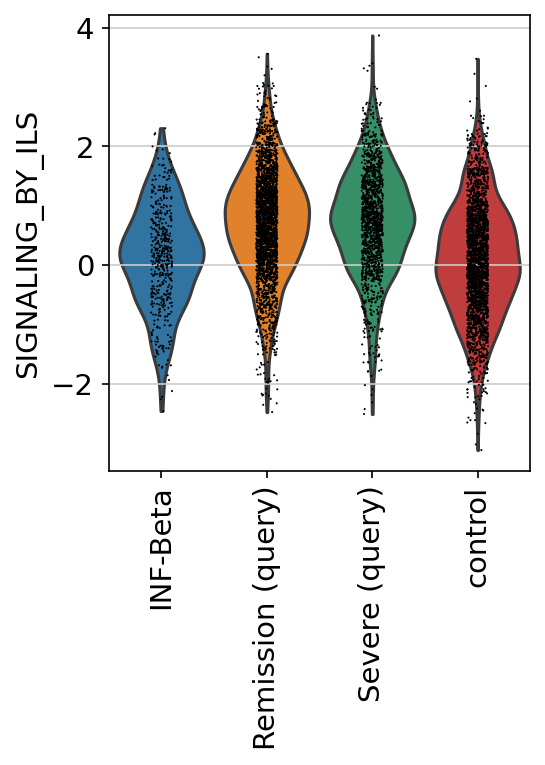

In [18]:
sc.pl.violin(ct_pathway_adata['CD8+ T cells'], 
                     keys="SIGNALING_BY_ILS"
                     ,groupby="source2", rotation=90)

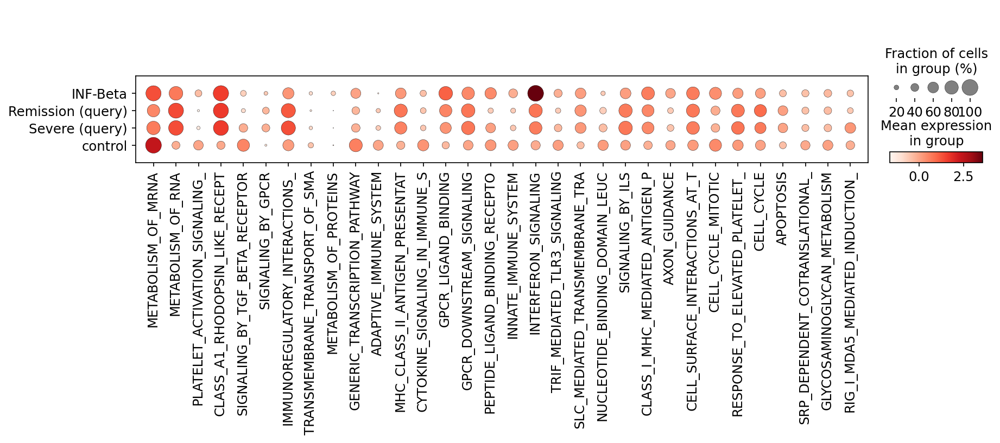

In [19]:
sc.pl.dotplot(ct_pathway_adata['CD8+ T cells'], 
                     var_names=ct_pathway["CD8+ T cells"]['Remission (query)']["terms"]
                     ,groupby="source2")

         Falling back to preprocessing with `sc.pp.pca` and default params.


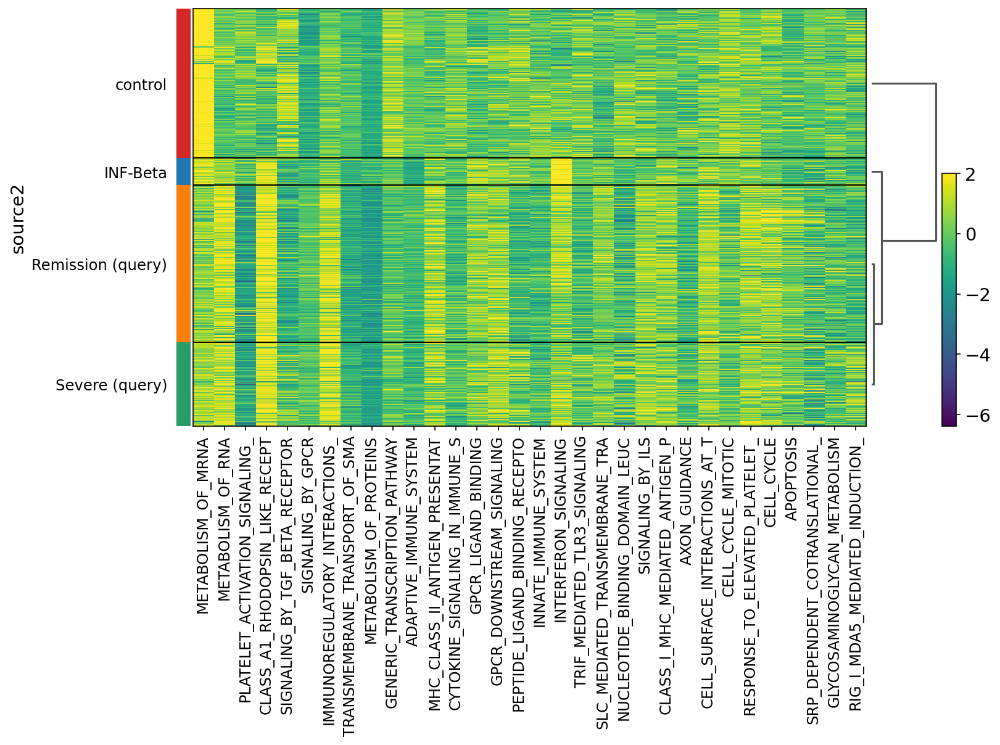

In [20]:
sc.pl.heatmap(ct_pathway_adata['CD8+ T cells'], 
                     var_names=ct_pathway["CD8+ T cells"]['Remission (query)']["terms"]
                     ,groupby="source2", vmax=2,dendrogram=True, )

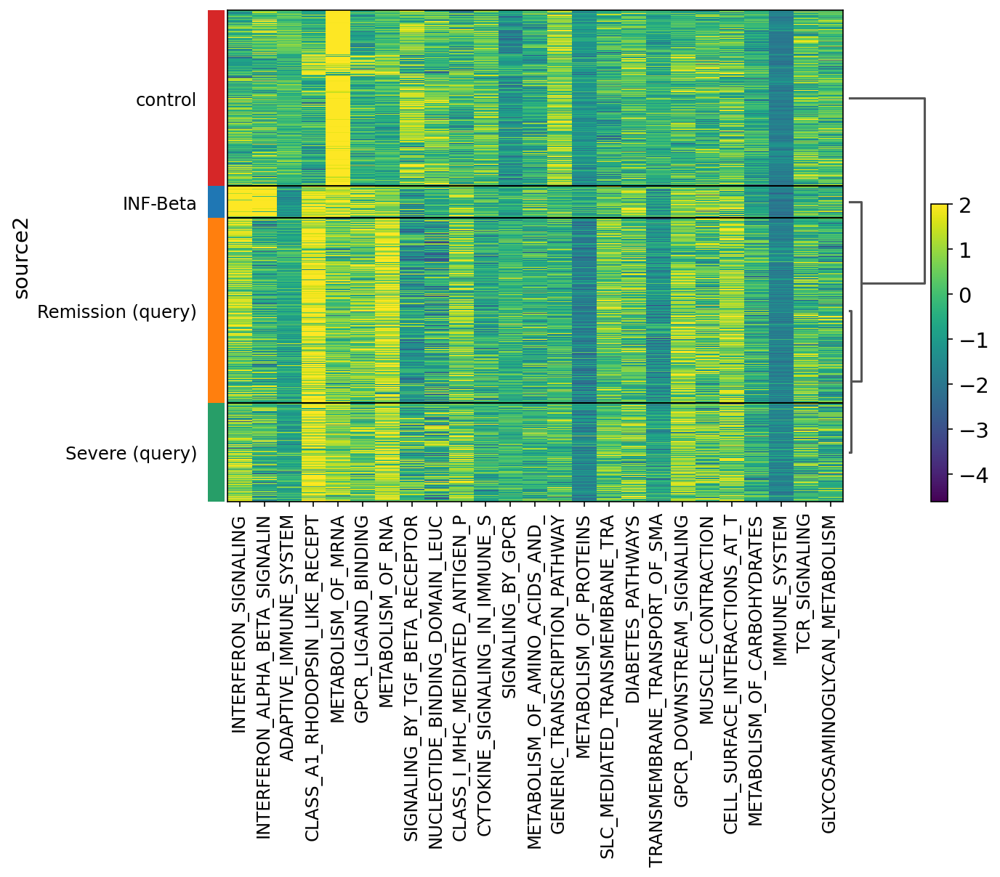

In [21]:
sc.pl.heatmap(ct_pathway_adata['CD8+ T cells'], 
                     var_names=ct_pathway["CD8+ T cells"]["INF-Beta"]["terms"]
                     ,groupby="source2", vmax=2,dendrogram=True)

In [22]:
ct_pathway["CD8+ T cells"]["INF-Beta"]

{'terms': array(['INTERFERON_SIGNALING', 'INTERFERON_ALPHA_BETA_SIGNALIN',
        'ADAPTIVE_IMMUNE_SYSTEM', 'CLASS_A1_RHODOPSIN_LIKE_RECEPT',
        'METABOLISM_OF_MRNA', 'GPCR_LIGAND_BINDING', 'METABOLISM_OF_RNA',
        'SIGNALING_BY_TGF_BETA_RECEPTOR', 'NUCLEOTIDE_BINDING_DOMAIN_LEUC',
        'CLASS_I_MHC_MEDIATED_ANTIGEN_P', 'CYTOKINE_SIGNALING_IN_IMMUNE_S',
        'SIGNALING_BY_GPCR', 'METABOLISM_OF_AMINO_ACIDS_AND_',
        'GENERIC_TRANSCRIPTION_PATHWAY', 'METABOLISM_OF_PROTEINS',
        'SLC_MEDIATED_TRANSMEMBRANE_TRA', 'DIABETES_PATHWAYS',
        'TRANSMEMBRANE_TRANSPORT_OF_SMA', 'GPCR_DOWNSTREAM_SIGNALING',
        'MUSCLE_CONTRACTION', 'CELL_SURFACE_INTERACTIONS_AT_T',
        'METABOLISM_OF_CARBOHYDRATES', 'IMMUNE_SYSTEM', 'TCR_SIGNALING',
        'GLYCOSAMINOGLYCAN_METABOLISM'], dtype=object),
 'bf': array([ 4.31,  4.11,  2.72,  1.91, -1.69, -1.52, -1.25, -1.25, -1.03,
        -1.02,  1.  ,  0.92,  0.9 ,  0.81, -0.73, -0.7 ,  0.68, -0.66,
        -0.63, -0.61,  0.5

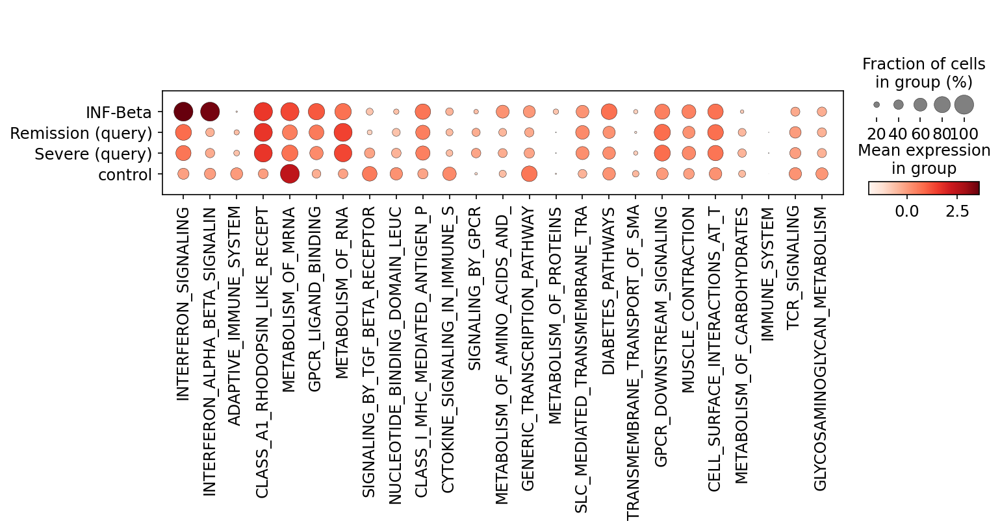

In [23]:
sc.pl.dotplot(ct_pathway_adata['CD8+ T cells'], 
                     var_names=ct_pathway["CD8+ T cells"]["INF-Beta"]["terms"]
                     ,groupby="source2")

In [72]:
ct_pathway["CD8+ T cells"]

{'INF-Beta': {'terms': array(['INTERFERON_SIGNALING', 'INTERFERON_ALPHA_BETA_SIGNALIN',
         'ADAPTIVE_IMMUNE_SYSTEM', 'CLASS_A1_RHODOPSIN_LIKE_RECEPT',
         'METABOLISM_OF_MRNA', 'GPCR_LIGAND_BINDING', 'METABOLISM_OF_RNA',
         'SIGNALING_BY_TGF_BETA_RECEPTOR', 'NUCLEOTIDE_BINDING_DOMAIN_LEUC',
         'CLASS_I_MHC_MEDIATED_ANTIGEN_P', 'CYTOKINE_SIGNALING_IN_IMMUNE_S',
         'SIGNALING_BY_GPCR', 'METABOLISM_OF_AMINO_ACIDS_AND_',
         'GENERIC_TRANSCRIPTION_PATHWAY', 'METABOLISM_OF_PROTEINS',
         'SLC_MEDIATED_TRANSMEMBRANE_TRA', 'DIABETES_PATHWAYS',
         'TRANSMEMBRANE_TRANSPORT_OF_SMA', 'GPCR_DOWNSTREAM_SIGNALING',
         'MUSCLE_CONTRACTION', 'CELL_SURFACE_INTERACTIONS_AT_T',
         'METABOLISM_OF_CARBOHYDRATES', 'IMMUNE_SYSTEM', 'TCR_SIGNALING',
         'GLYCOSAMINOGLYCAN_METABOLISM'], dtype=object),
  'bf': array([ 4.31,  4.11,  2.72,  1.91, -1.69, -1.52, -1.25, -1.25, -1.03,
         -1.02,  1.  ,  0.92,  0.9 ,  0.81, -0.73, -0.7 ,  0.68, -0.66,


In [41]:
import numpy as np 

In [59]:
rd = np.random.choice(list(range(len(ct_pathway_adata['CD8+ T cells']))),
                 size =len(ct_pathway_adata['CD8+ T cells']), replace=False)

Trying to set attribute `.uns` of view, copying.


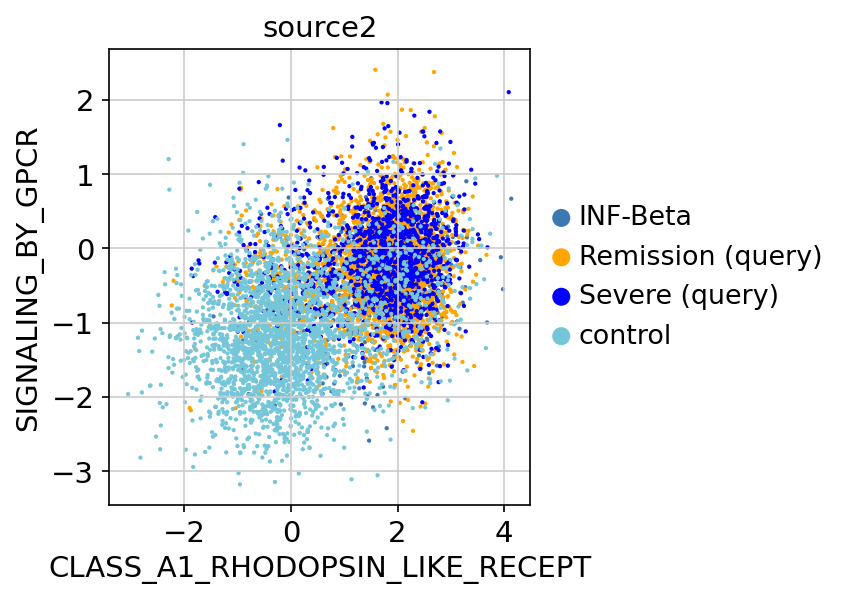

In [62]:
sc.pl.scatter(ct_pathway_adata['CD8+ T cells'][rd], x="CLASS_A1_RHODOPSIN_LIKE_RECEPT", y="SIGNALING_BY_GPCR", 
              color='source2', palette=["#3C79B2","orange","blue", "#75C6D8"])

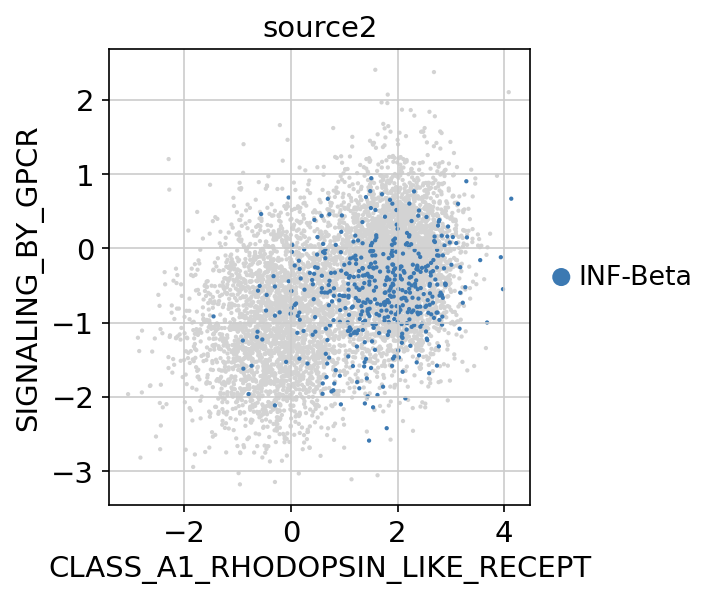

In [63]:
sc.pl.scatter(ct_pathway_adata['CD8+ T cells'], x="CLASS_A1_RHODOPSIN_LIKE_RECEPT", y="SIGNALING_BY_GPCR", 
              color='source2', groups=["INF-Beta"], save="cd8t_con")

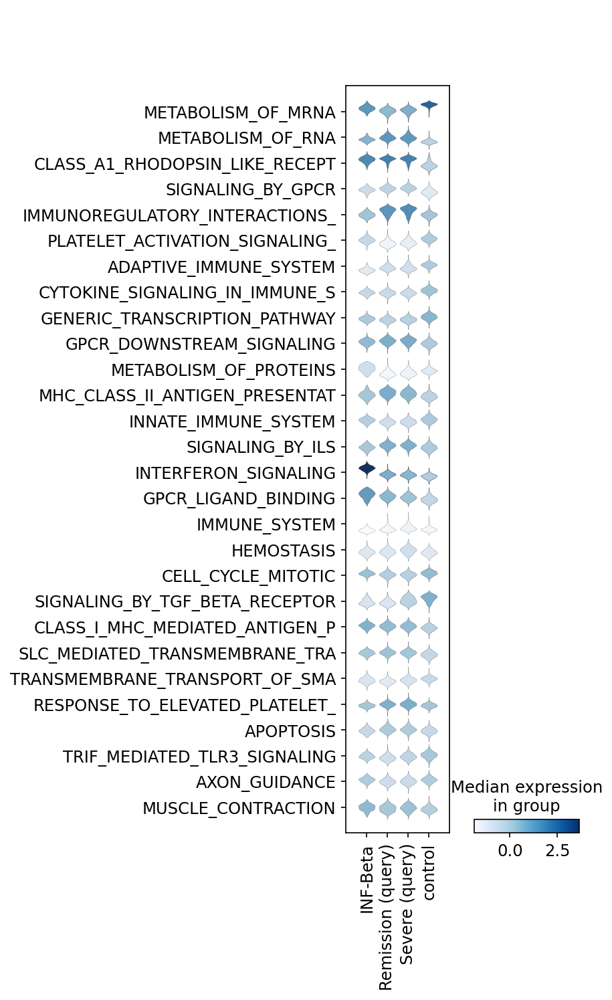

In [74]:
sc.pl.stacked_violin(ct_pathway_adata['CD8+ T cells'], 
                     var_names=ct_pathway["CD8+ T cells"]["Severe (query)"]["terms"]
                     ,groupby="source2",swap_axes=True, save="CD8T_stack")

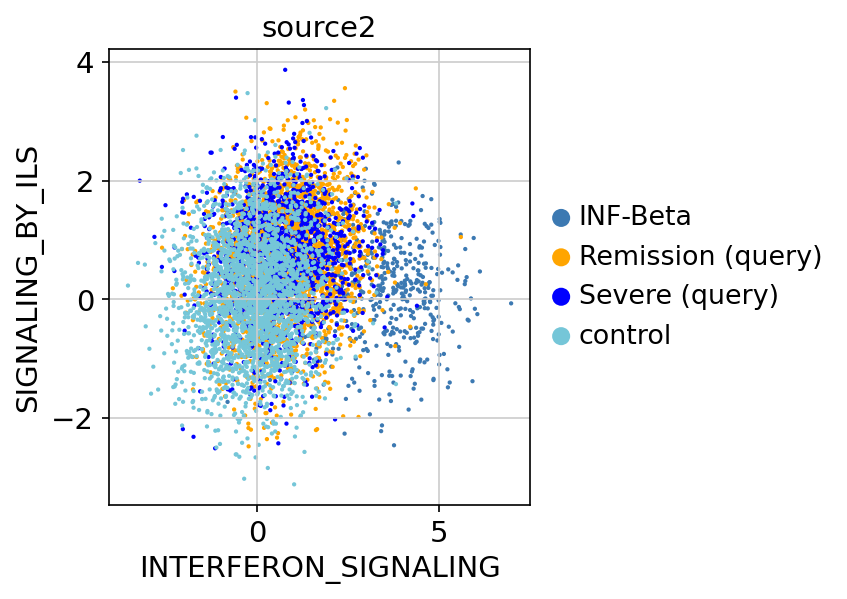

In [92]:
sc.pl.scatter(ct_pathway_adata['CD8+ T cells'], x="INTERFERON_SIGNALING", y="SIGNALING_BY_ILS", 
              color='source2',)

# Erythrocite 

In [360]:
ct_pathway["Erythrocytes"]["Severe (query)"]["terms"]

array(['HEMOSTASIS', 'TRIF_MEDIATED_TLR3_SIGNALING',
       'SLC_MEDIATED_TRANSMEMBRANE_TRA', 'CELL_SURFACE_INTERACTIONS_AT_T',
       'METABOLISM_OF_MRNA', 'FACTORS_INVOLVED_IN_MEGAKARYOC',
       'APOPTOSIS', 'TOLL_RECEPTOR_CASCADES', 'MUSCLE_CONTRACTION',
       'SIGNALING_BY_TGF_BETA_RECEPTOR', 'CELL_CYCLE_MITOTIC',
       'DEVELOPMENTAL_BIOLOGY', 'CLASS_I_MHC_MEDIATED_ANTIGEN_P',
       'DIABETES_PATHWAYS', 'METABOLISM_OF_PROTEINS',
       'METABOLISM_OF_NUCLEOTIDES', 'GENERIC_TRANSCRIPTION_PATHWAY',
       'PLATELET_ACTIVATION_SIGNALING_', 'AXON_GUIDANCE',
       'CYTOKINE_SIGNALING_IN_IMMUNE_S', 'CELL_CYCLE', 'AMYLOIDS',
       'TRANSMEMBRANE_TRANSPORT_OF_SMA', 'TRANSCRIPTION',
       'FATTY_ACID_TRIACYLGLYCEROL_AND', 'SIGNALING_BY_RHO_GTPASES',
       'MEMBRANE_TRAFFICKING', 'IMMUNE_SYSTEM',
       'CLASS_A1_RHODOPSIN_LIKE_RECEPT', 'IMMUNOREGULATORY_INTERACTIONS_',
       'SIGNALING_BY_GPCR', 'GLYCOSAMINOGLYCAN_METABOLISM',
       'GPCR_DOWNSTREAM_SIGNALING'], dtype=object)

In [ ]:
sc.pl.scatter(cd8t, x="PLATELET_ACTIVATION_SIGNALING_", y="CLASS_I_MHC_MEDIATED_ANTIGEN_P", 
              color='source2')

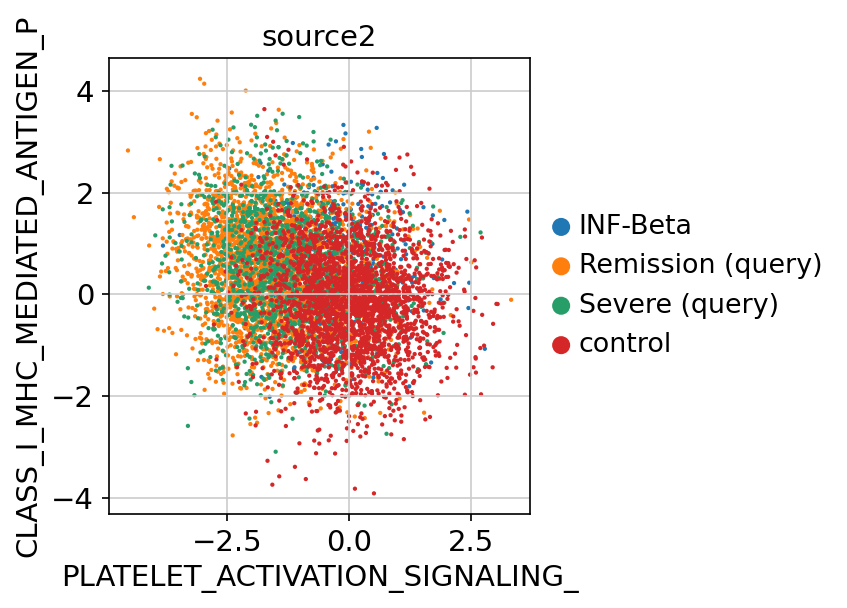

In [362]:
sc.pl.scatter(cd8t, x="PLATELET_ACTIVATION_SIGNALING_", y="CLASS_I_MHC_MEDIATED_ANTIGEN_P", 
              color='source2')

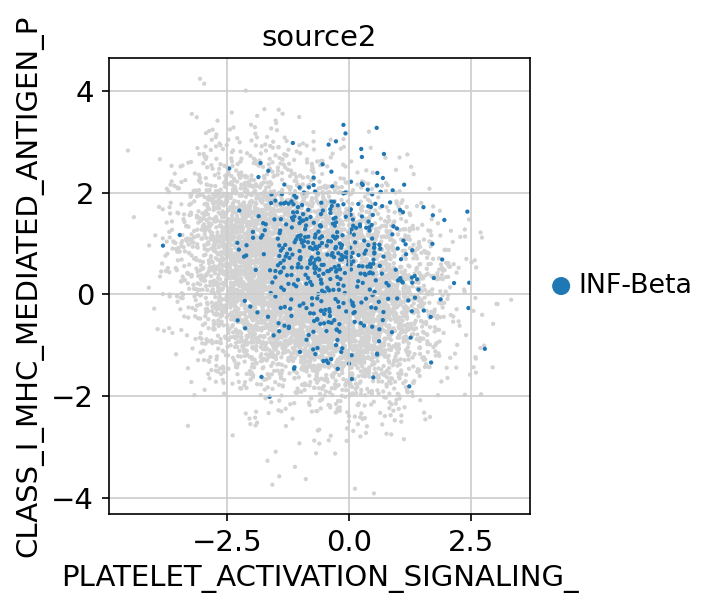

In [361]:
sc.pl.scatter(cd8t, x="PLATELET_ACTIVATION_SIGNALING_", y="CLASS_I_MHC_MEDIATED_ANTIGEN_P", 
              color='source2', groups=["INF-Beta"])

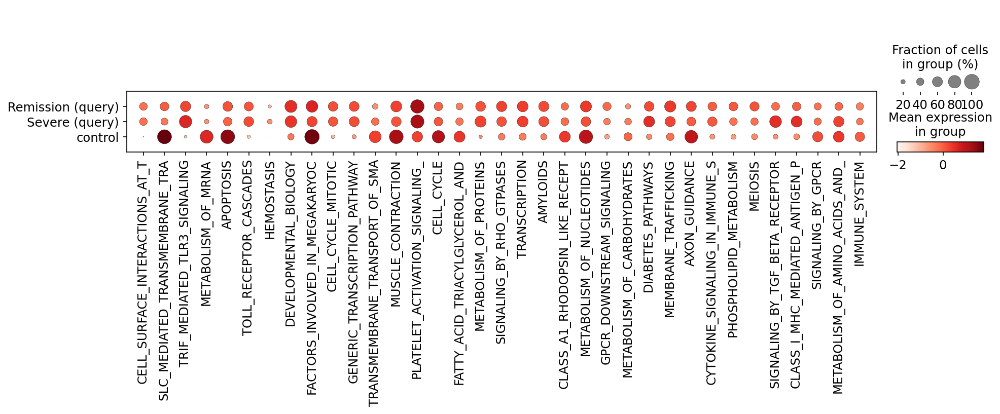

In [295]:
sc.pl.dotplot(ct_pathway_adata['Erythrocytes'], 
                     var_names=ct_pathway["Erythrocytes"]["Remission (query)"]["terms"]
                     ,groupby="source2")

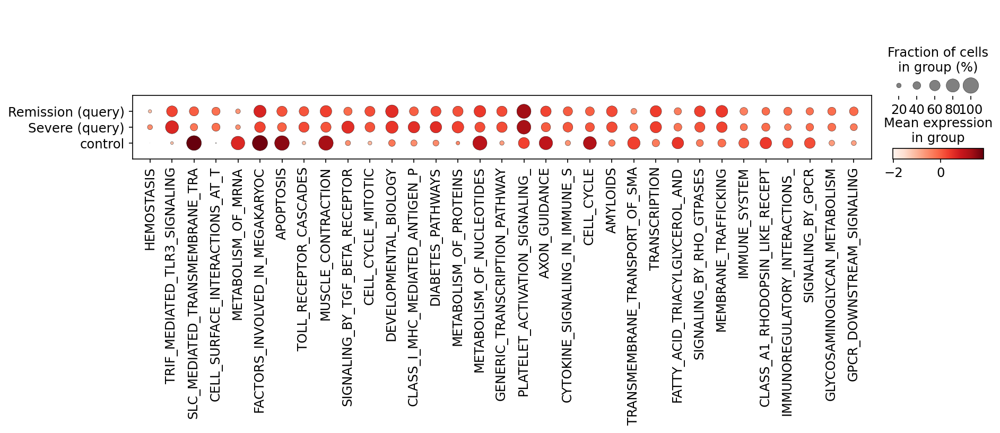

In [293]:
sc.pl.dotplot(ct_pathway_adata['Erythrocytes'], 
                     var_names=ct_pathway["Erythrocytes"]["Severe (query)"]["terms"]
                     ,groupby="source2")

### B cells

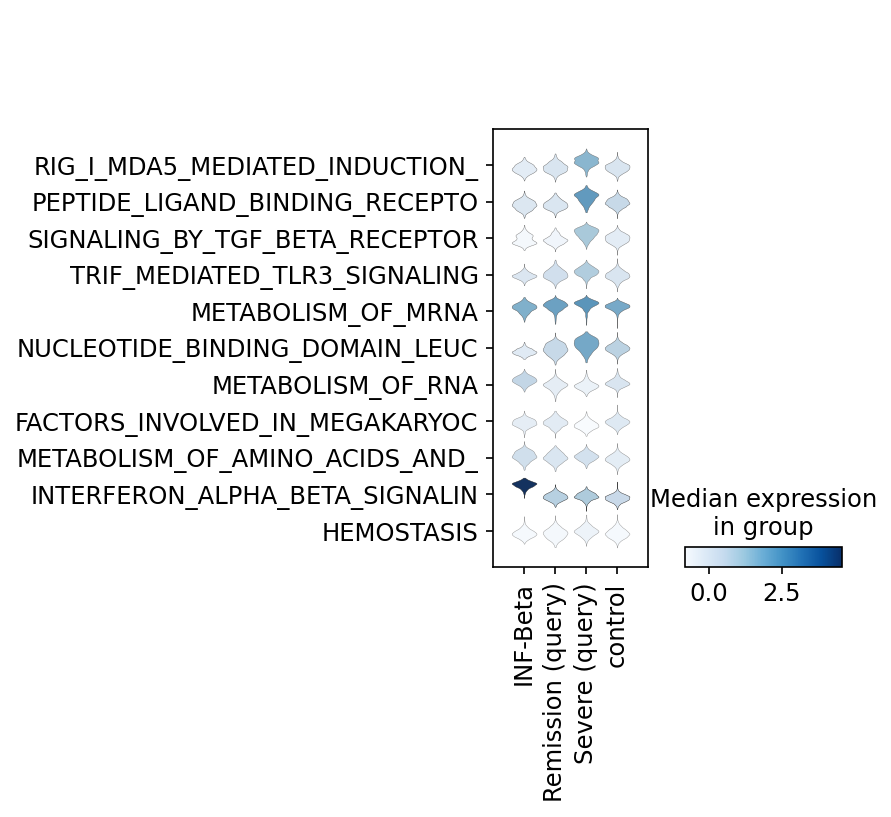

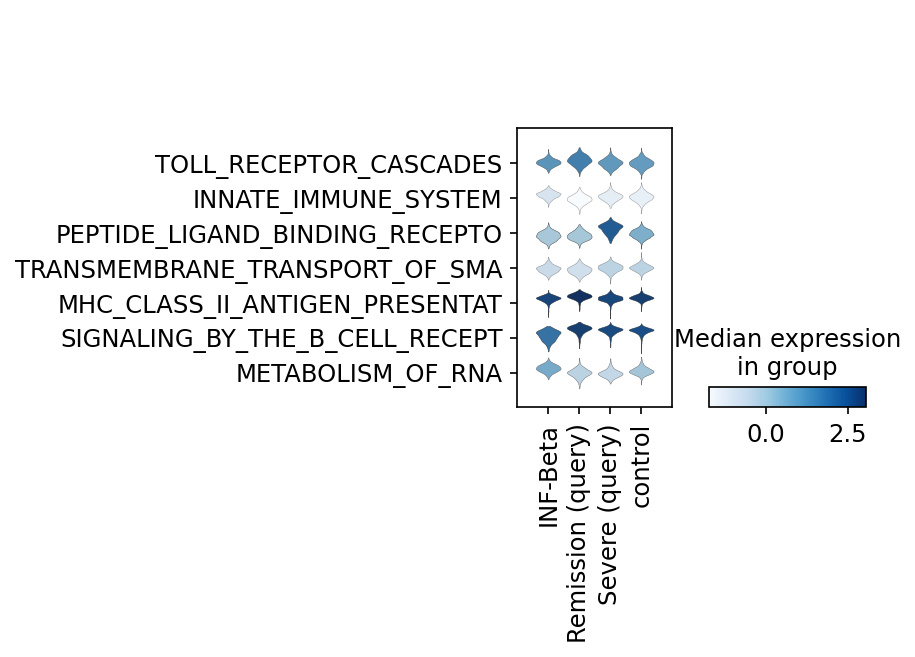

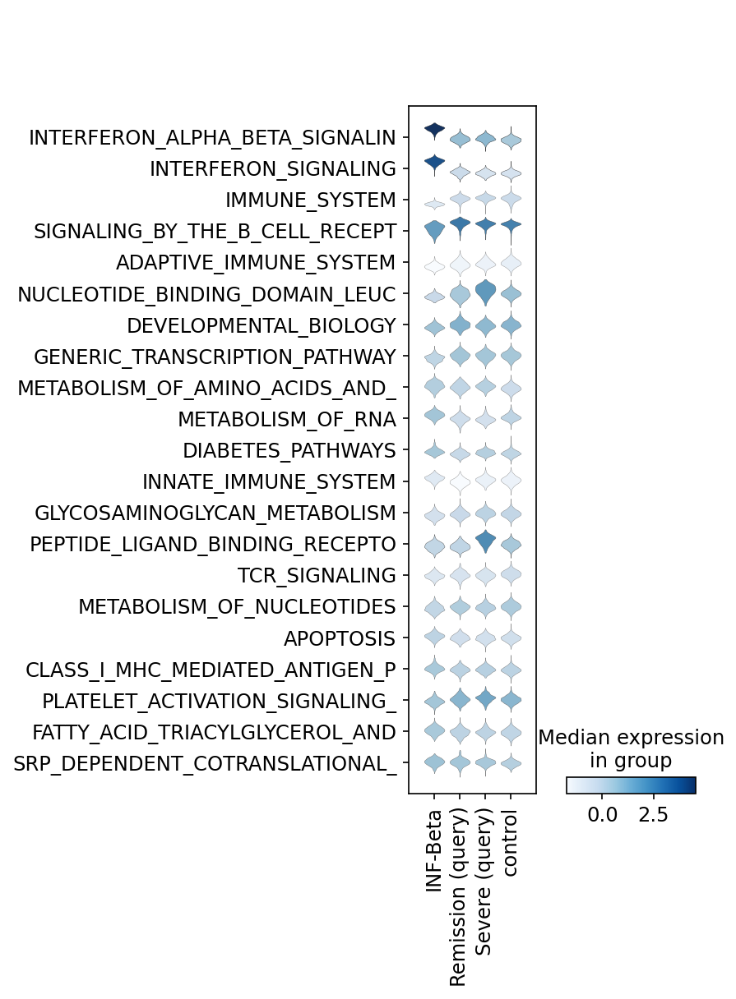

In [307]:
sc.pl.stacked_violin(ct_pathway_adata['B'], 
                     var_names=ct_pathway["B"]["Severe (query)"]["terms"]
                     ,groupby="source2", swap_axes=True)

sc.pl.stacked_violin(ct_pathway_adata['B'], 
                     var_names=ct_pathway["B"]["Remission (query)"]["terms"]
                     ,groupby="source2", swap_axes=True)

sc.pl.stacked_violin(ct_pathway_adata['B'], 
                     var_names=ct_pathway["B"]["INF-Beta"]["terms"]
                     ,groupby="source2", swap_axes=True)

## CD4T

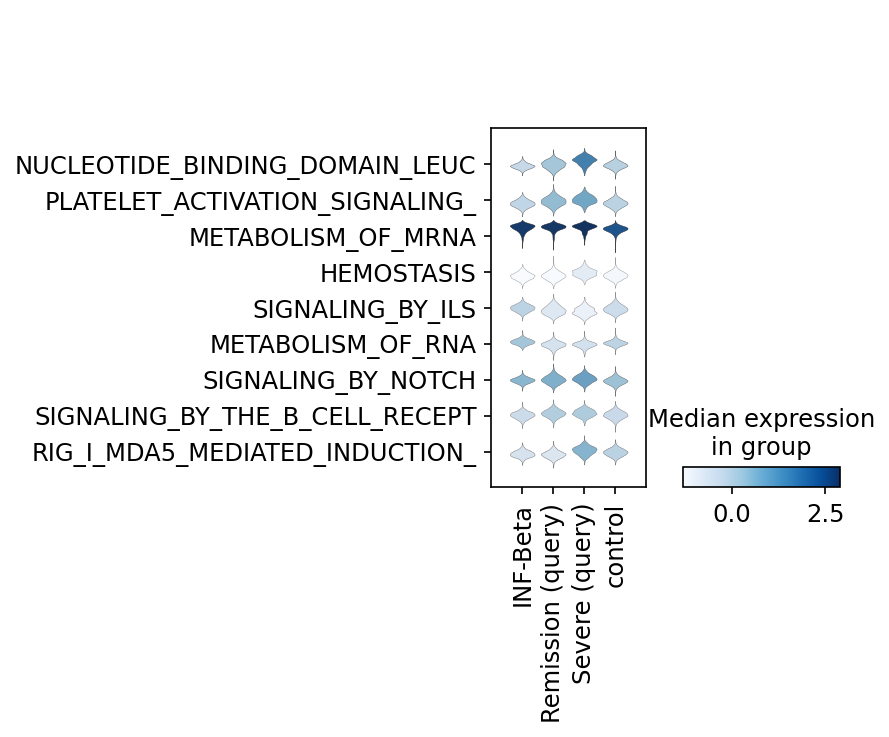

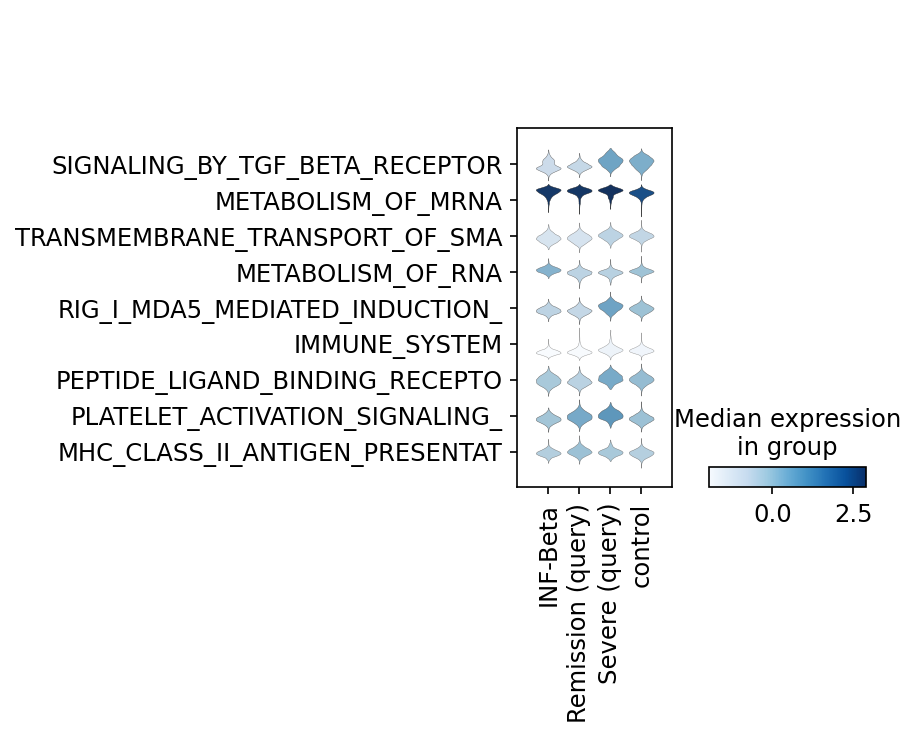

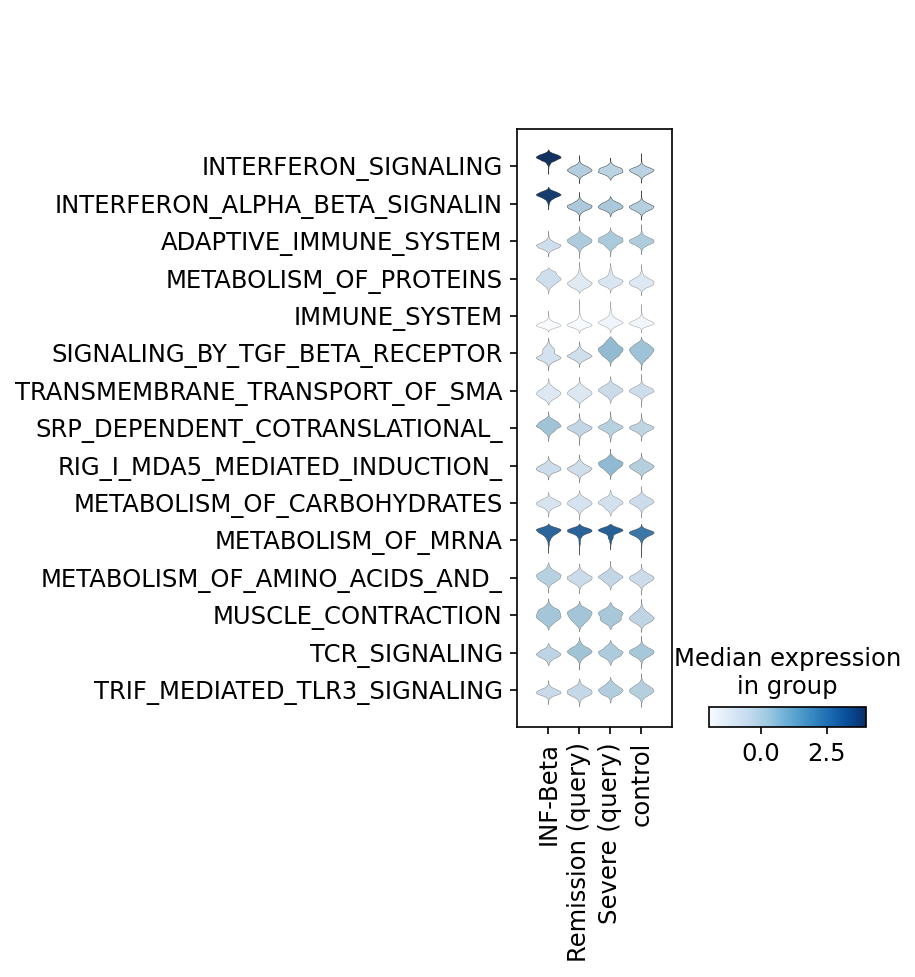

In [312]:
sc.pl.stacked_violin(ct_pathway_adata['CD4+ T cells'], 
                     var_names=ct_pathway['CD4+ T cells']["Severe (query)"]["terms"]
                     ,groupby="source2", swap_axes=True)

sc.pl.stacked_violin(ct_pathway_adata['CD4+ T cells'], 
                     var_names=ct_pathway['CD4+ T cells']["Remission (query)"]["terms"]
                     ,groupby="source2", swap_axes=True)

sc.pl.stacked_violin(ct_pathway_adata['CD4+ T cells'], 
                     var_names=ct_pathway['CD4+ T cells']["INF-Beta"]["terms"]
                     ,groupby="source2", swap_axes=True)

NK

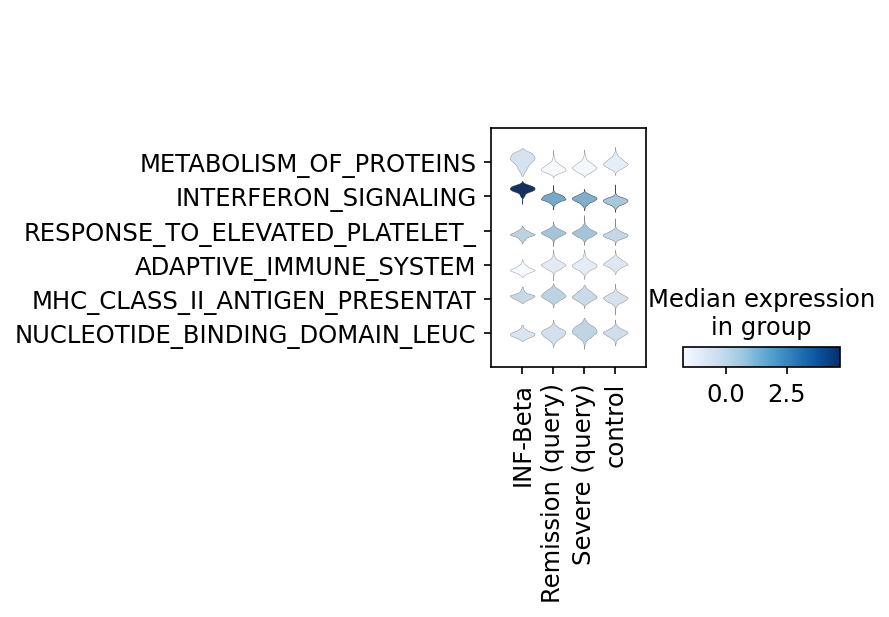

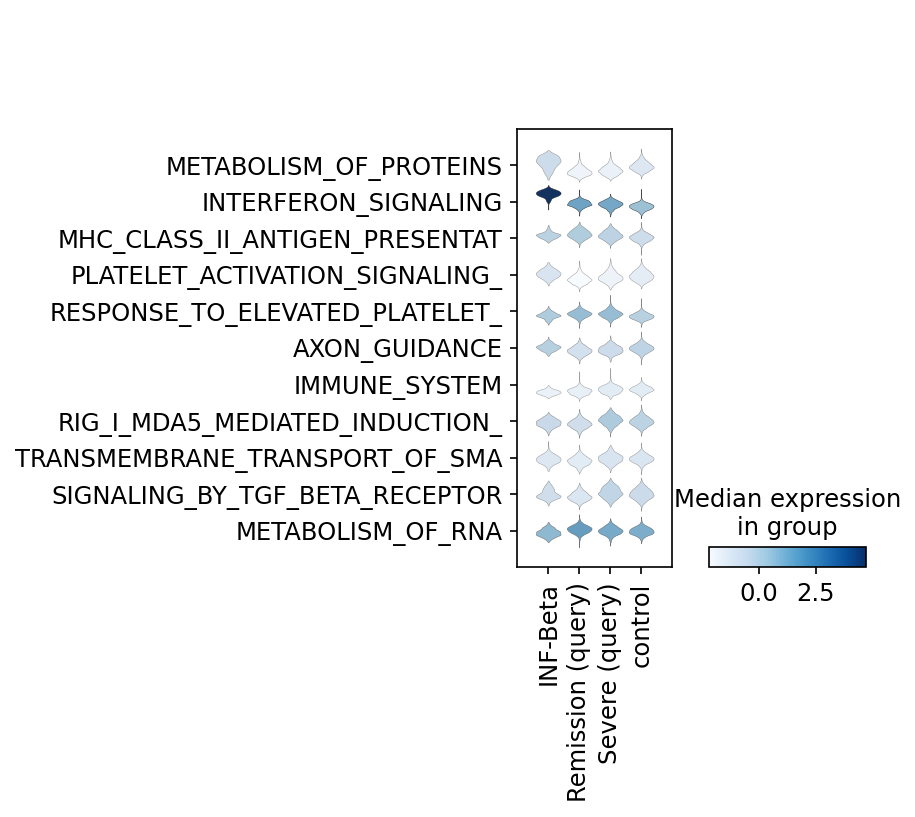

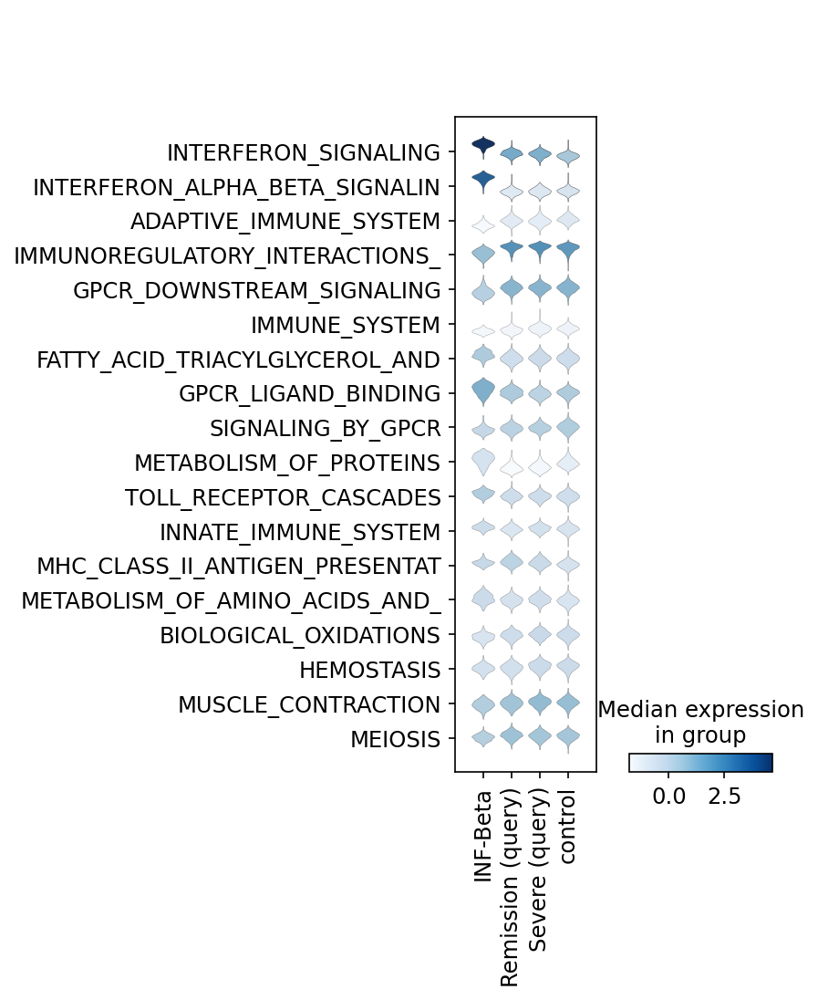

In [319]:
sc.pl.stacked_violin(ct_pathway_adata['NK cells'], 
                     var_names=ct_pathway['NK cells']["Severe (query)"]["terms"]
                     ,groupby="source2", swap_axes=True)

sc.pl.stacked_violin(ct_pathway_adata['NK cells'], 
                     var_names=ct_pathway['NK cells']["Remission (query)"]["terms"]
                     ,groupby="source2", swap_axes=True)

sc.pl.stacked_violin(ct_pathway_adata['NK cells'], 
                     var_names=ct_pathway['NK cells']["INF-Beta"]["terms"]
                     ,groupby="source2", swap_axes=True)

In [363]:
ct_pathway['CD14+ Monocytes']["Severe (query)"]["terms"]

array(['RIG_I_MDA5_MEDIATED_INDUCTION_', 'CLASS_A1_RHODOPSIN_LIKE_RECEPT',
       'METABOLISM_OF_MRNA', 'SIGNALING_BY_GPCR',
       'NUCLEOTIDE_BINDING_DOMAIN_LEUC', 'INTERFERON_SIGNALING',
       'MUSCLE_CONTRACTION', 'HEMOSTASIS',
       'PEPTIDE_LIGAND_BINDING_RECEPTO', 'CIRCADIAN_CLOCK',
       'METABOLISM_OF_AMINO_ACIDS_AND_', 'MHC_CLASS_II_ANTIGEN_PRESENTAT',
       'RESPONSE_TO_ELEVATED_PLATELET_', 'SRP_DEPENDENT_COTRANSLATIONAL_',
       'METABOLISM_OF_RNA', 'APOPTOSIS'], dtype=object)

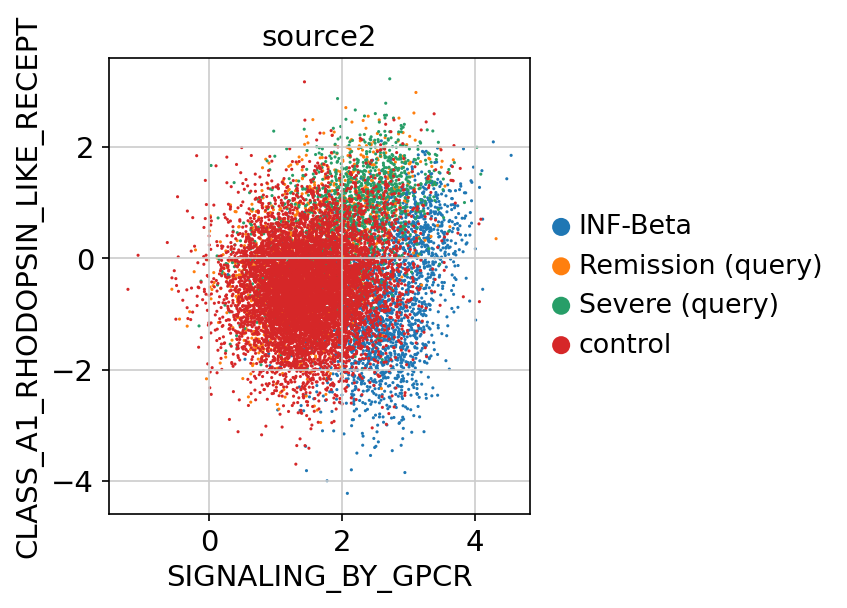

In [365]:
sc.pl.scatter(ct_pathway_adata['CD14+ Monocytes'],
              x="SIGNALING_BY_GPCR", 
              y="CLASS_A1_RHODOPSIN_LIKE_RECEPT", 
              color='source2')

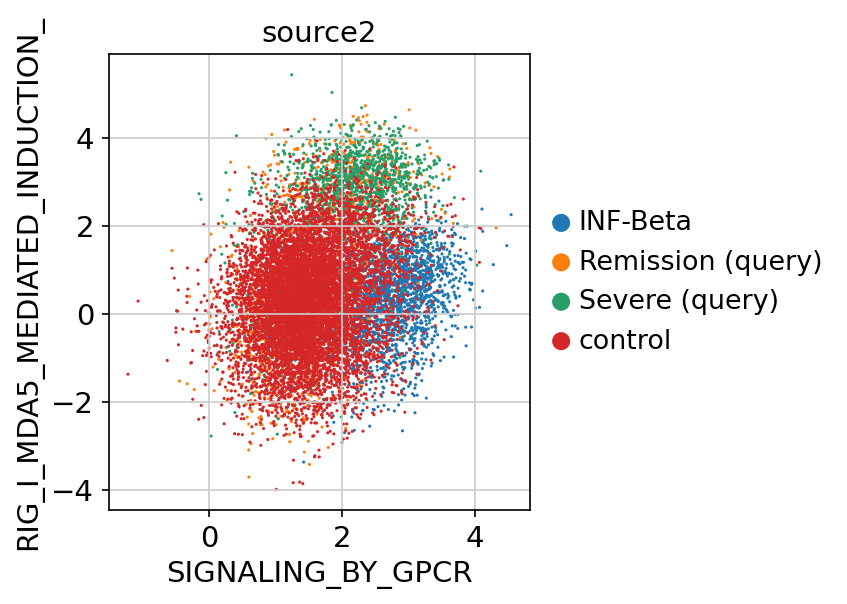

In [366]:
sc.pl.scatter(ct_pathway_adata['CD14+ Monocytes'],
              x="SIGNALING_BY_GPCR", 
              y="RIG_I_MDA5_MEDIATED_INDUCTION_", 
              color='source2')

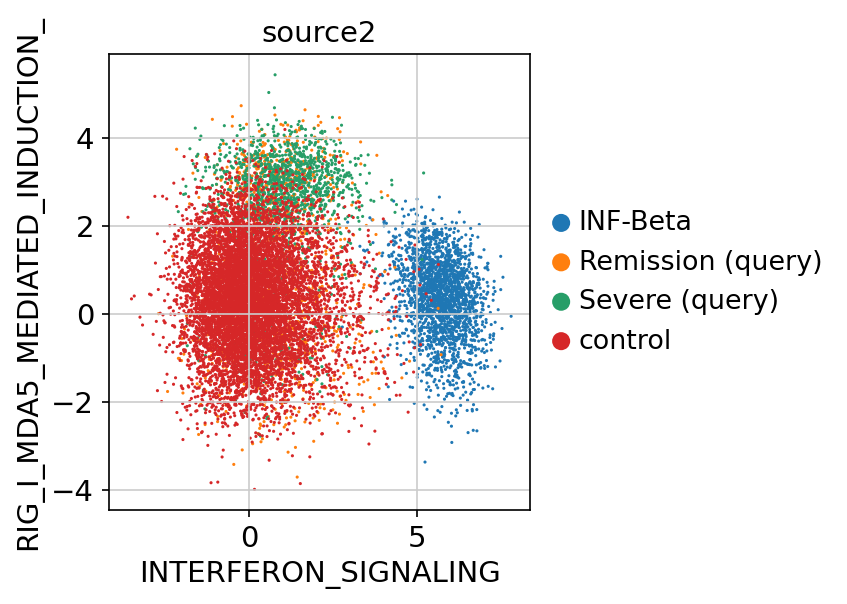

In [367]:
sc.pl.scatter(ct_pathway_adata['CD14+ Monocytes'],
              x="INTERFERON_SIGNALING", 
              y="RIG_I_MDA5_MEDIATED_INDUCTION_", 
              color='source2')

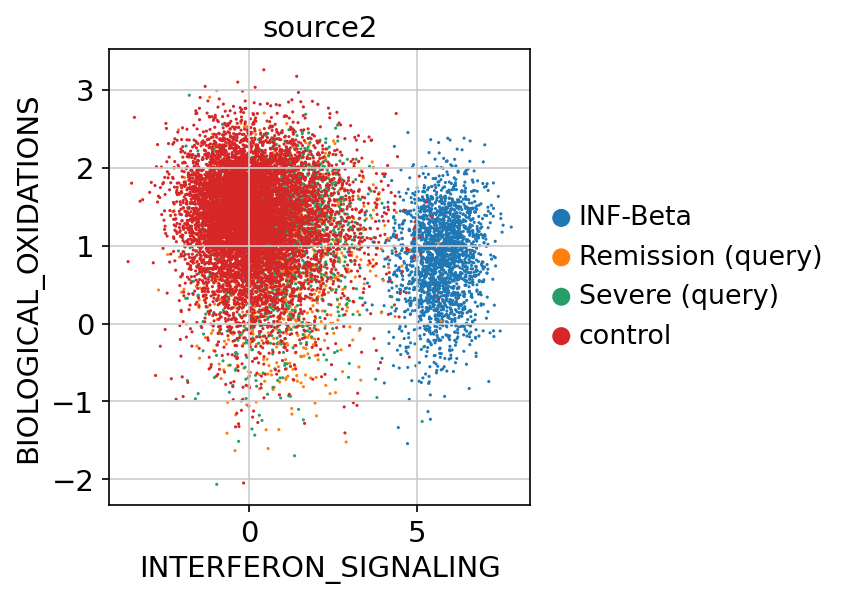

In [370]:
sc.pl.scatter(ct_pathway_adata['CD14+ Monocytes'],
              x="INTERFERON_SIGNALING", 
              y="BIOLOGICAL_OXIDATIONS", 
              color='source2')

In [368]:
ct_pathway['CD14+ Monocytes']["INF-Beta"]["terms"]

array(['INTERFERON_SIGNALING', 'INTERFERON_ALPHA_BETA_SIGNALIN',
       'GPCR_DOWNSTREAM_SIGNALING', 'METABOLISM_OF_CARBOHYDRATES',
       'IMMUNE_SYSTEM', 'SIGNALING_BY_GPCR',
       'CYTOKINE_SIGNALING_IN_IMMUNE_S', 'ADAPTIVE_IMMUNE_SYSTEM',
       'METABOLISM_OF_NUCLEOTIDES', 'METABOLISM_OF_AMINO_ACIDS_AND_',
       'METABOLISM_OF_RNA', 'SRP_DEPENDENT_COTRANSLATIONAL_', 'APOPTOSIS',
       'METABOLISM_OF_MRNA', 'PLATELET_ACTIVATION_SIGNALING_',
       'BIOLOGICAL_OXIDATIONS', 'FACTORS_INVOLVED_IN_MEGAKARYOC',
       'GENERIC_TRANSCRIPTION_PATHWAY', 'METABOLISM_OF_LIPIDS_AND_LIPOP',
       'MHC_CLASS_II_ANTIGEN_PRESENTAT', 'MUSCLE_CONTRACTION',
       'SLC_MEDIATED_TRANSMEMBRANE_TRA', 'AMYLOIDS',
       'TRANSMEMBRANE_TRANSPORT_OF_SMA', 'SIGNALING_BY_NOTCH',
       'CLASS_I_MHC_MEDIATED_ANTIGEN_P', 'TCR_SIGNALING',
       'SIGNALING_BY_THE_B_CELL_RECEPT', 'AXON_GUIDANCE', 'TRANSCRIPTION',
       'INNATE_IMMUNE_SYSTEM', 'DEVELOPMENTAL_BIOLOGY',
       'CELL_SURFACE_INTERACTIONS_AT_T',

##  CD14+ Monocytes

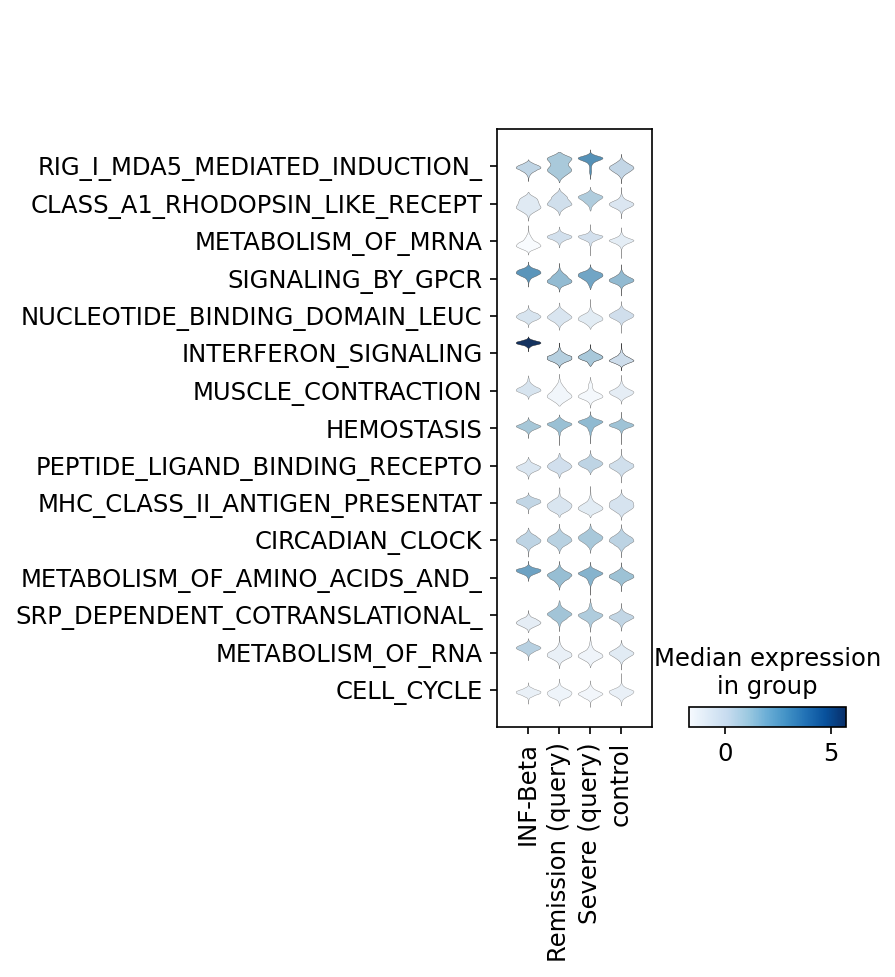

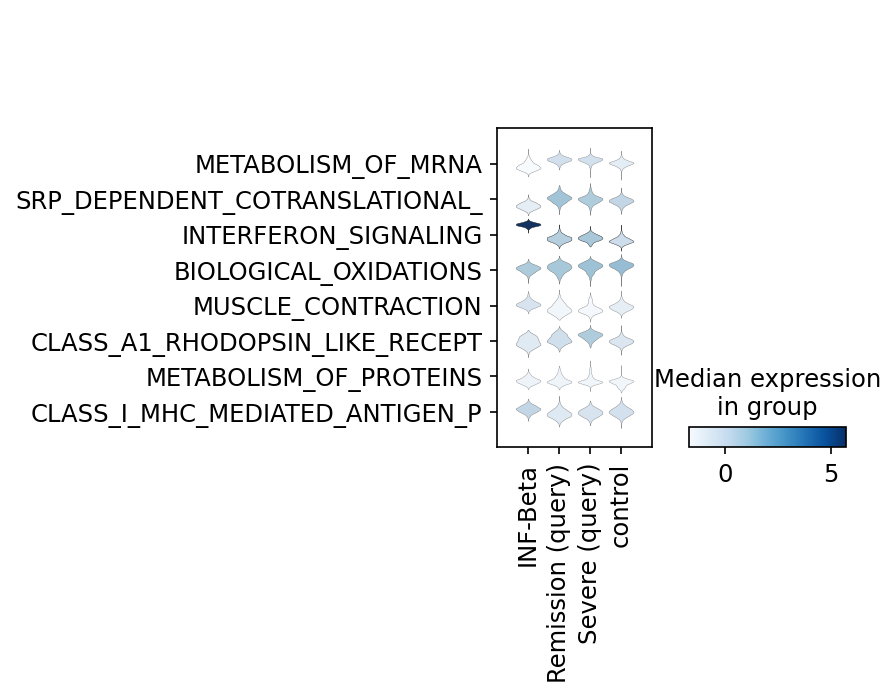

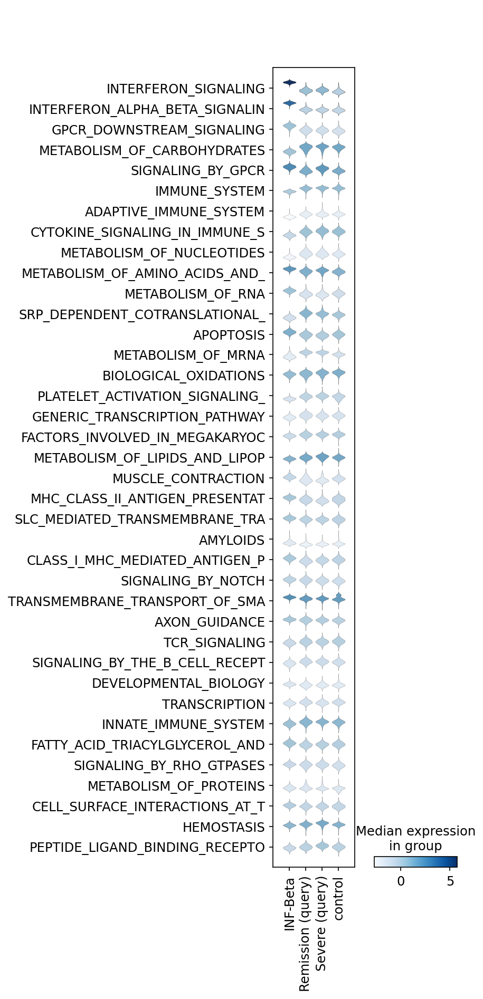

In [75]:
sc.pl.stacked_violin(ct_pathway_adata['CD14+ Monocytes'], 
                     var_names=ct_pathway['CD14+ Monocytes']["Severe (query)"]["terms"]
                     ,groupby="source2", swap_axes=True, save="cd14_sev")

sc.pl.stacked_violin(ct_pathway_adata['CD14+ Monocytes'], 
                     var_names=ct_pathway['CD14+ Monocytes']["Remission (query)"]["terms"]
                     ,groupby="source2", swap_axes=True, save="cd14_sev")

sc.pl.stacked_violin(ct_pathway_adata['CD14+ Monocytes'], 
                     var_names=ct_pathway['CD14+ Monocytes']["INF-Beta"]["terms"]
                     ,groupby="source2", swap_axes=True, save="cd14_inf")

In [76]:
ct_pathway['CD14+ Monocytes']["Severe (query)"]["terms"]

array(['RIG_I_MDA5_MEDIATED_INDUCTION_', 'CLASS_A1_RHODOPSIN_LIKE_RECEPT',
       'METABOLISM_OF_MRNA', 'SIGNALING_BY_GPCR',
       'NUCLEOTIDE_BINDING_DOMAIN_LEUC', 'INTERFERON_SIGNALING',
       'MUSCLE_CONTRACTION', 'HEMOSTASIS',
       'PEPTIDE_LIGAND_BINDING_RECEPTO', 'MHC_CLASS_II_ANTIGEN_PRESENTAT',
       'CIRCADIAN_CLOCK', 'METABOLISM_OF_AMINO_ACIDS_AND_',
       'SRP_DEPENDENT_COTRANSLATIONAL_', 'METABOLISM_OF_RNA',
       'CELL_CYCLE'], dtype=object)

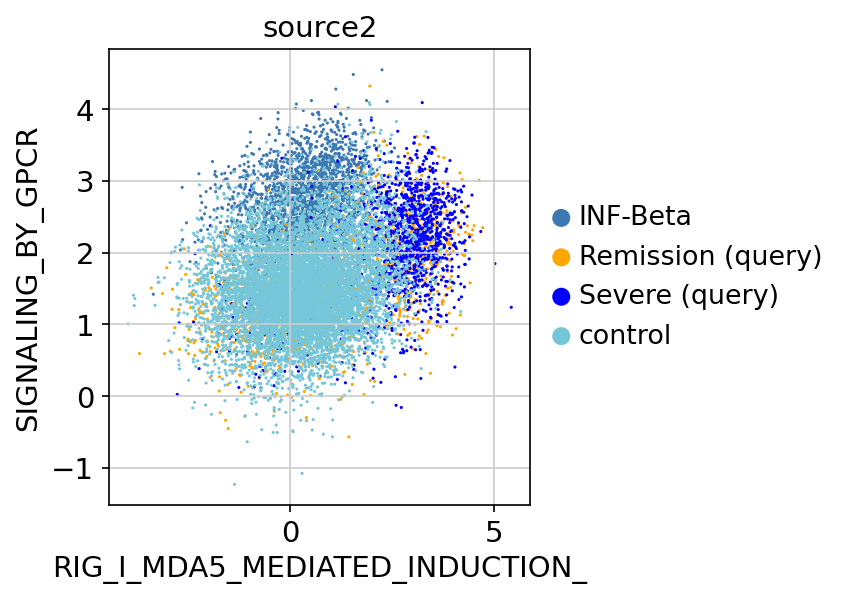

In [89]:
sc.pl.scatter(ct_pathway_adata['CD14+ Monocytes'], x="RIG_I_MDA5_MEDIATED_INDUCTION_", y="SIGNALING_BY_GPCR", 
              color='source2', palette=["#3C79B2","orange","blue", "#75C6D8"], save="cd14_splat")

###  CD16+ Monocytes

In [83]:
ct_pathway_adata['CD16+ Monocytes'].obs.source2.value_counts()

control              1332
INF-Beta              537
Remission (query)     126
Severe (query)         29
Name: source2, dtype: int64

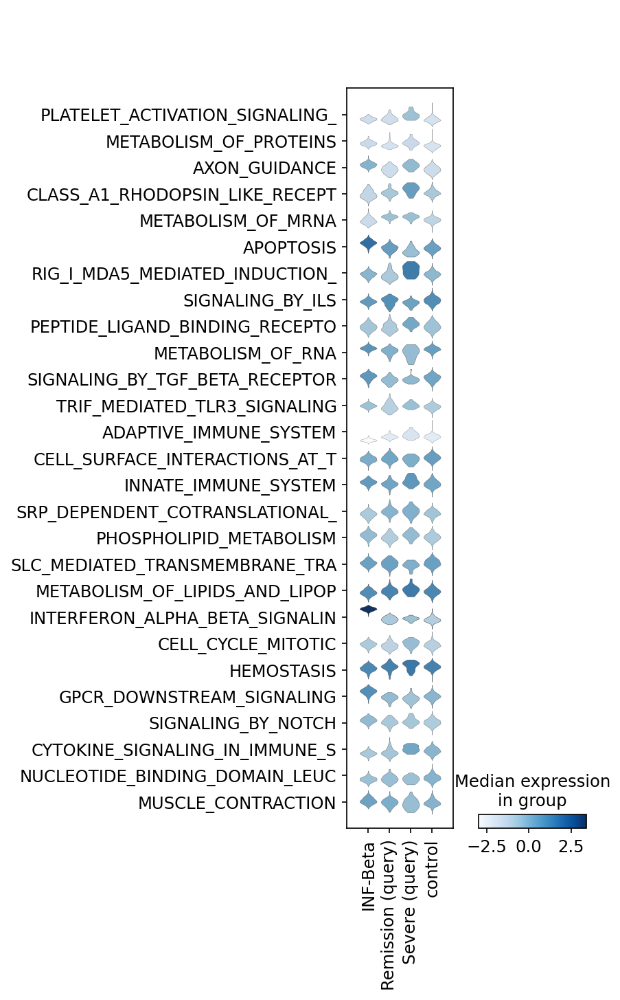

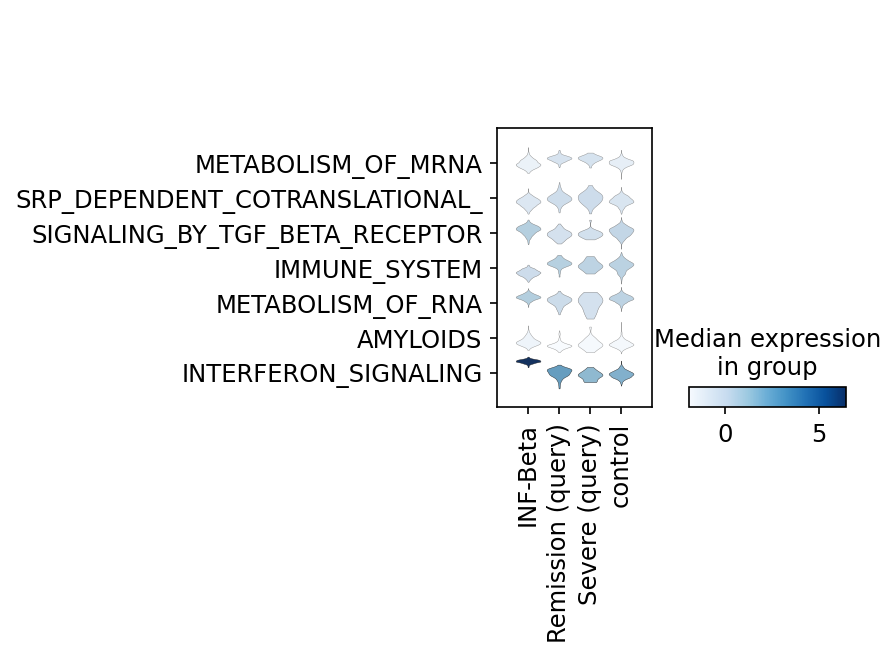

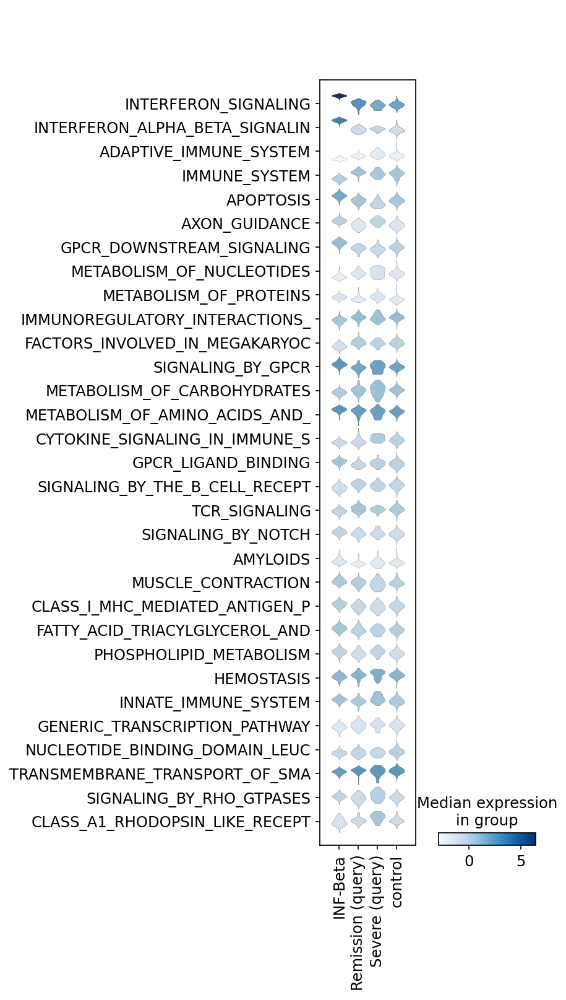

In [84]:
sc.pl.stacked_violin(ct_pathway_adata['CD16+ Monocytes'], 
                     var_names=ct_pathway['CD16+ Monocytes']["Severe (query)"]["terms"]
                     ,groupby="source2", swap_axes=True, save="cd16_sev")

sc.pl.stacked_violin(ct_pathway_adata['CD16+ Monocytes'], 
                     var_names=ct_pathway['CD16+ Monocytes']["Remission (query)"]["terms"]
                     ,groupby="source2", swap_axes=True, save="cd16_remi")

sc.pl.stacked_violin(ct_pathway_adata['CD16+ Monocytes'], 
                     var_names=ct_pathway['CD16+ Monocytes']["INF-Beta"]["terms"]
                     ,groupby="source2", swap_axes=True, save="cd16_inf")

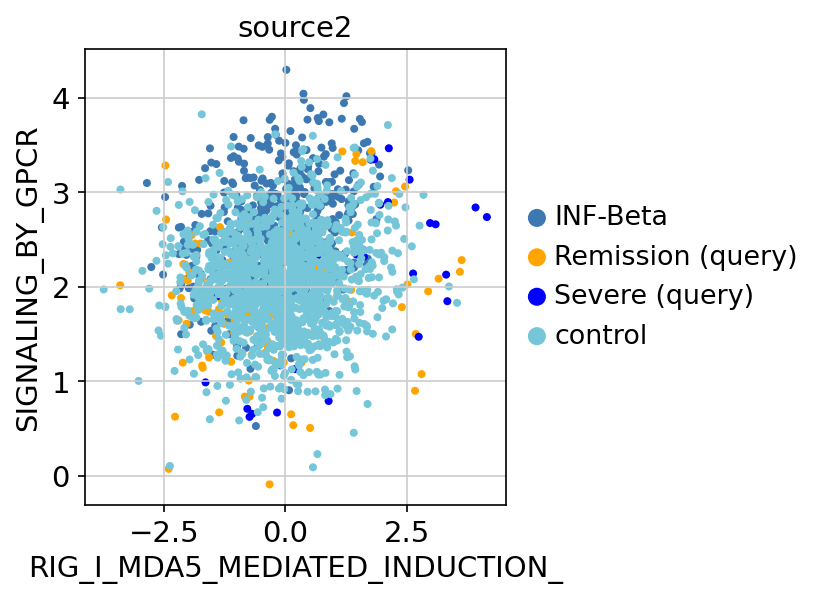

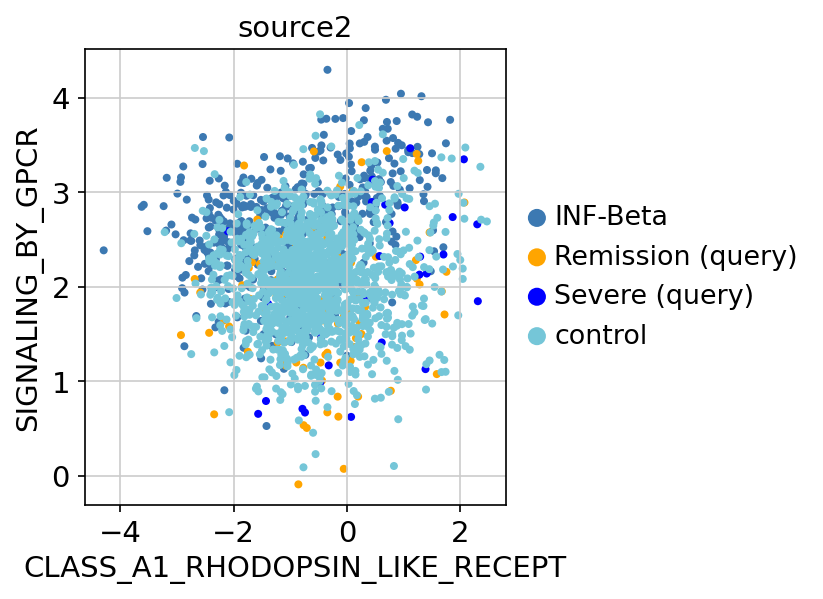

In [88]:
sc.pl.scatter(ct_pathway_adata['CD16+ Monocytes'], x="RIG_I_MDA5_MEDIATED_INDUCTION_", y="SIGNALING_BY_GPCR", 
              color='source2', palette=["#3C79B2","orange","blue", "#75C6D8"], save="cd16_splat")





sc.pl.scatter(ct_pathway_adata['CD16+ Monocytes'], x="CLASS_A1_RHODOPSIN_LIKE_RECEPT", y="SIGNALING_BY_GPCR", 
              color='source2', palette=["#3C79B2","orange","blue", "#75C6D8"], save="cd16_splat")




